# ADS-508-01-SP23 Team 8: Final Project

# Exploratory Data Analysis (EDA)

Much of the code is modified from `Fregly, C., & Barth, A. (2021). Data science on AWS: Implementing end-to-end, continuous AI and machine learning pipelines. O’Reilly.`

## Install missing dependencies

[PyAthena](https://pypi.org/project/PyAthena/) is a Python DB API 2.0 (PEP 249) compliant client for Amazon Athena.

In [2]:
!pip install --disable-pip-version-check -q PyAthena==2.1.0
!pip install missingno

## Globally import libraries

In [3]:
import boto3
from botocore.client import ClientError
from IPython.core.display import display, HTML
import pandas as pd
import numpy as np
from pyathena import connect
import matplotlib.pyplot as plt
import missingno as msno
import sagemaker
import seaborn as sns
from sklearn.feature_selection import VarianceThreshold
from scipy import stats
from scipy.stats import skew

%matplotlib inline

## Instantiate AWS SageMaker session

In [4]:
session = boto3.session.Session()
region = session.region_name
sagemaker_session = sagemaker.Session()
def_bucket = sagemaker_session.default_bucket()
bucket = 't8-test-final'
role = sagemaker.get_execution_role()

s3 = boto3.Session().client(service_name="s3", region_name=region)

In [5]:
print(f"Default bucket: {def_bucket}")
print(f"Public T8 bucket: {bucket}")

Default bucket: sagemaker-us-east-1-657724983756
Public T8 bucket: t8-test-final


In [6]:
# Set S3 staging directory -- this is a temporary directory used for Athena queries
s3_staging_dir = f"s3://{def_bucket}/team_8_data/athena/staging"
print(s3_staging_dir)

s3://sagemaker-us-east-1-657724983756/team_8_data/athena/staging


In [7]:
conn = connect(region_name=region,
               s3_staging_dir=s3_staging_dir)

In [8]:
database_name = "ads508_t8"

## Explore DB tables

### `census`

In [9]:
cen_tsv_tbl_name = 'census'

#### Explore via SQL SELECT statements

In [10]:
# Run query to review a sample of records
cen_bourough01 = "bronx"

cen_select_borough_stmnt01 = f"""
SELECT * FROM {database_name}.{cen_tsv_tbl_name}
WHERE LOWER(borough) = '{cen_bourough01}'
LIMIT 11
"""

# Display SQL statement
print(cen_select_borough_stmnt01)

# Run SQL statement against Athena table
cen_df01_s01 = pd.read_sql(cen_select_borough_stmnt01,
                           conn)

# Display results
cen_df01_s01.head(11)


SELECT * FROM ads508_t8.census
WHERE LOWER(borough) = 'bronx'
LIMIT 11



,censustract,county,borough,totalpop,men,women,hispanic,white,black,native,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,36005000100,Bronx,Bronx,7703,7133,570,29.9,6.1,60.9,0.2,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN
1,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,...,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
2,36005000400,Bronx,Bronx,5915,2896,3019,62.7,3.6,30.7,0.0,...,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
3,36005001600,Bronx,Bronx,5879,2558,3321,65.1,1.6,32.4,0.0,...,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
4,36005001900,Bronx,Bronx,2591,1206,1385,55.4,9.0,29.0,0.0,...,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2
5,36005002000,Bronx,Bronx,8516,3301,5215,61.1,1.6,31.1,0.3,...,4.3,1.0,0.0,46.0,2508,71.0,21.3,7.7,0.0,17.2
6,36005002300,Bronx,Bronx,4774,2130,2644,62.3,0.2,36.5,1.0,...,14.0,1.5,4.1,42.7,1191,74.2,16.1,9.7,0.0,18.9
7,36005002400,Bronx,Bronx,150,109,41,0.0,52.0,48.0,0.0,...,0.0,0.0,0.0,NaN,113,62.8,37.2,0.0,0.0,0.0
8,36005002500,Bronx,Bronx,5355,2338,3017,76.5,1.5,18.9,0.0,...,17.7,1.8,2.7,35.5,1691,85.1,8.3,6.1,0.5,9.4
9,36005002701,Bronx,Bronx,3016,1375,1641,68.0,0.0,31.2,0.0,...,18.0,0.0,1.6,42.8,1102,86.9,8.5,4.5,0.0,15.2


#### Perform aggregated summaries

In [11]:
# Run query to review a sample of records
cen_select_hispanic_stmnt01 = f"""
SELECT DISTINCT
    hispanic,
    COUNT(*)
FROM {database_name}.{cen_tsv_tbl_name}
WHERE hispanic IS NULL
GROUP BY hispanic
LIMIT 10
"""

# Display SQL statement
print(cen_select_hispanic_stmnt01)

# Run SQL statement against Athena table
cen_df01_s02 = pd.read_sql(cen_select_hispanic_stmnt01,
                           conn)

# Display results
cen_df01_s02.head(11)


SELECT DISTINCT
    hispanic,
    COUNT(*)
FROM ads508_t8.census
WHERE hispanic IS NULL
GROUP BY hispanic
LIMIT 10



,hispanic,_col1
0,None,39


In [12]:
cen_summ_borough_stmnt01 = f"""
SELECT
    borough,
    COUNT(*) AS ctract_count,
    SUM(totalpop) AS bor_pop,
    SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
    SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
    SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
    SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
    SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
    SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
    SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
FROM {database_name}.{cen_tsv_tbl_name}
GROUP BY borough
LIMIT 100
"""

# Display SQL statement
print(cen_summ_borough_stmnt01)

# Run SQL statement against Athena table
cen_df01_s03 = pd.read_sql(cen_summ_borough_stmnt01,
                           conn)
# Display results
cen_df01_s03.head(11)


SELECT
    borough,
    COUNT(*) AS ctract_count,
    SUM(totalpop) AS bor_pop,
    SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
    SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
    SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
    SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
    SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
    SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
    SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
FROM ads508_t8.census
GROUP BY borough
LIMIT 100



,borough,ctract_count,bor_pop,hispanic_perc,white_perc,black_perc,native_perc,asian_perc,child_poverty_perc,income_avg
0,Brooklyn,761,2595259,0.196219,0.357155,0.311851,0.001728,0.114031,0.293884,51694
1,Queens,669,2301139,0.279454,0.261341,0.173913,0.002189,0.242256,0.195747,59851
2,Bronx,339,1428357,0.546306,0.102867,0.295901,0.002247,0.035982,0.394679,36822
3,Manhattan,288,1629507,0.257999,0.471131,0.127395,0.001357,0.115712,0.198270,78003
4,Staten Island,110,472481,0.178469,0.628205,0.095900,0.001179,0.079440,0.155067,73993


In [13]:
cen_summ_borough_stmnt01 = f"""
SELECT
    censustract,
    COUNT(*) AS ctract_count,
    SUM(totalpop) AS bor_pop,
    SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
    SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
    SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
    SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
    SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
    SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
    SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
FROM {database_name}.{cen_tsv_tbl_name}
GROUP BY censustract
LIMIT 100
"""

# Display SQL statement
print(cen_summ_borough_stmnt01)

# Run SQL statement against Athena table
cen_df01_s04 = pd.read_sql(cen_summ_borough_stmnt01,
                           conn)
# Display results
cen_df01_s04.head(11)


SELECT
    censustract,
    COUNT(*) AS ctract_count,
    SUM(totalpop) AS bor_pop,
    SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
    SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
    SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
    SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
    SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
    SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
    SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
FROM ads508_t8.census
GROUP BY censustract
LIMIT 100



,censustract,ctract_count,bor_pop,hispanic_perc,white_perc,black_perc,native_perc,asian_perc,child_poverty_perc,income_avg
0,36005000200,1,5403,0.757912,0.022950,0.159911,0.000000,0.042014,0.206922,72034
1,36005001900,1,2591,0.553840,0.089927,0.289849,0.000000,0.020841,0.314936,37936
2,36005003100,1,1466,0.723056,0.006139,0.246248,0.000000,0.021828,0.251705,37250
3,36005004001,1,1419,0.513037,0.112051,0.107822,0.000000,0.216350,0.286117,48056
4,36005005200,1,2277,0.696970,0.004831,0.267018,0.000000,0.028986,0.577953,17756
5,36005006000,1,1256,0.694268,0.040605,0.214172,0.000000,0.018312,0.468153,41190
6,36005009200,1,5622,0.609036,0.027926,0.141942,0.000000,0.178051,0.281928,35227
7,36005009300,1,6517,0.725948,0.011969,0.257941,0.001074,0.000000,0.497008,30159
8,36005012101,1,3057,0.727838,0.034020,0.217861,0.000000,0.011122,0.485116,27813
9,36005013300,1,7284,0.697968,0.010022,0.288029,0.000000,0.000000,0.264003,25282


#### Load potential predictors and target for further exploration using pandas

In [14]:
cen_box_stmnt01 = f"""
SELECT
    borough,
    totalpop,
    men,
    women,
    hispanic,
    white,
    black,
    native,
    asian,
    citizen,
    income,
    poverty,
    childpoverty,
    professional,
    service,
    office,
    construction,
    production,
    drive,
    carpool,
    transit,
    walk,
    othertransp,
    workathome,
    meancommute,
    employed,
    privatework,
    publicwork,
    selfemployed,
    familywork,
    unemployment
FROM {database_name}.{cen_tsv_tbl_name}
WHERE childpoverty IS NOT NULL
LIMIT 5000
"""

# Display SQL statement
print(cen_box_stmnt01)

# Run SQL statement against Athena table
cen_df01_s05 = pd.read_sql(cen_box_stmnt01,
                           conn)

# Display results
cen_df01_s05.head(11)


SELECT
    borough,
    totalpop,
    men,
    women,
    hispanic,
    white,
    black,
    native,
    asian,
    citizen,
    income,
    poverty,
    childpoverty,
    professional,
    service,
    office,
    construction,
    production,
    drive,
    carpool,
    transit,
    walk,
    othertransp,
    workathome,
    meancommute,
    employed,
    privatework,
    publicwork,
    selfemployed,
    familywork,
    unemployment
FROM ads508_t8.census
WHERE childpoverty IS NOT NULL
LIMIT 5000



,borough,totalpop,men,women,hispanic,white,black,native,asian,citizen,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,...,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
1,Bronx,5915,2896,3019,62.7,3.6,30.7,0.0,0.3,4100,...,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
2,Bronx,5879,2558,3321,65.1,1.6,32.4,0.0,0.0,3536,...,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
3,Bronx,2591,1206,1385,55.4,9.0,29.0,0.0,2.1,1557,...,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2
4,Bronx,8516,3301,5215,61.1,1.6,31.1,0.3,3.3,5436,...,4.3,1.0,0.0,46.0,2508,71.0,21.3,7.7,0.0,17.2
5,Bronx,4774,2130,2644,62.3,0.2,36.5,1.0,0.0,3056,...,14.0,1.5,4.1,42.7,1191,74.2,16.1,9.7,0.0,18.9
6,Bronx,150,109,41,0.0,52.0,48.0,0.0,0.0,41,...,0.0,0.0,0.0,NaN,113,62.8,37.2,0.0,0.0,0.0
7,Bronx,5355,2338,3017,76.5,1.5,18.9,0.0,3.0,2509,...,17.7,1.8,2.7,35.5,1691,85.1,8.3,6.1,0.5,9.4
8,Bronx,3016,1375,1641,68.0,0.0,31.2,0.0,0.0,1456,...,18.0,0.0,1.6,42.8,1102,86.9,8.5,4.5,0.0,15.2
9,Bronx,4778,2427,2351,71.3,1.6,26.2,0.0,0.0,2365,...,7.1,0.7,0.5,44.0,1559,75.0,14.0,11.0,0.0,10.6


#### Barplots for select features

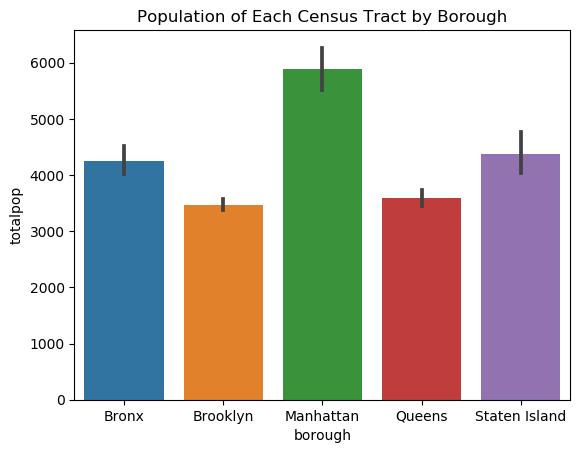

In [15]:
popbar = sns.barplot(x='borough',
                     y='totalpop',
                     data=cen_df01_s05).set(title='Population of Each Census Tract by Borough')

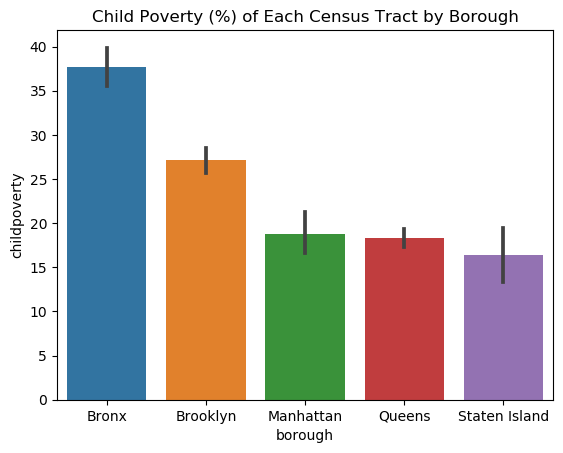

In [16]:
%matplotlib inline
pov_bar = sns.barplot(x='borough',
                      y='childpoverty',
                      data=cen_df01_s05).set(title='Child Poverty (%) of Each Census Tract by Borough')

#### Display boxplots for select features

[Text(0.5, 1.0, 'Population of Each Census Tract by Borough')]

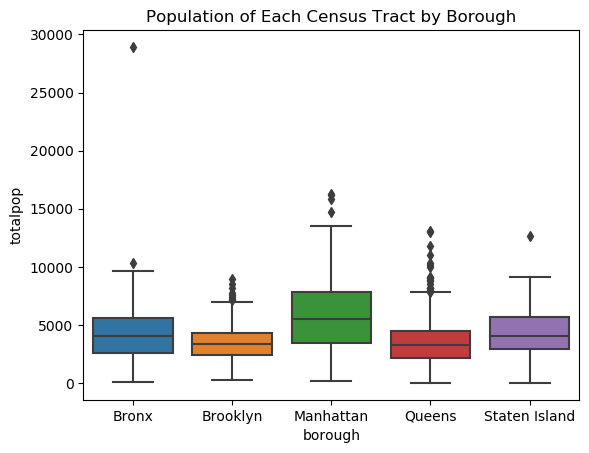

In [17]:
%matplotlib inline
sns.boxplot(x='borough',
            y='totalpop',
            data=cen_df01_s05).set(title='Population of Each Census Tract by Borough')

[Text(0.5, 1.0, 'Child Poverty (%) of Each Census Tract by Borough')]

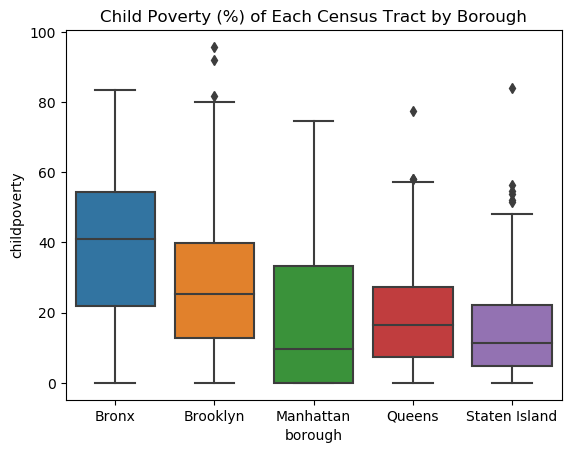

In [18]:
%matplotlib inline
sns.boxplot(x='borough',
            y='childpoverty',
            data=cen_df01_s05).set(title='Child Poverty (%) of Each Census Tract by Borough')

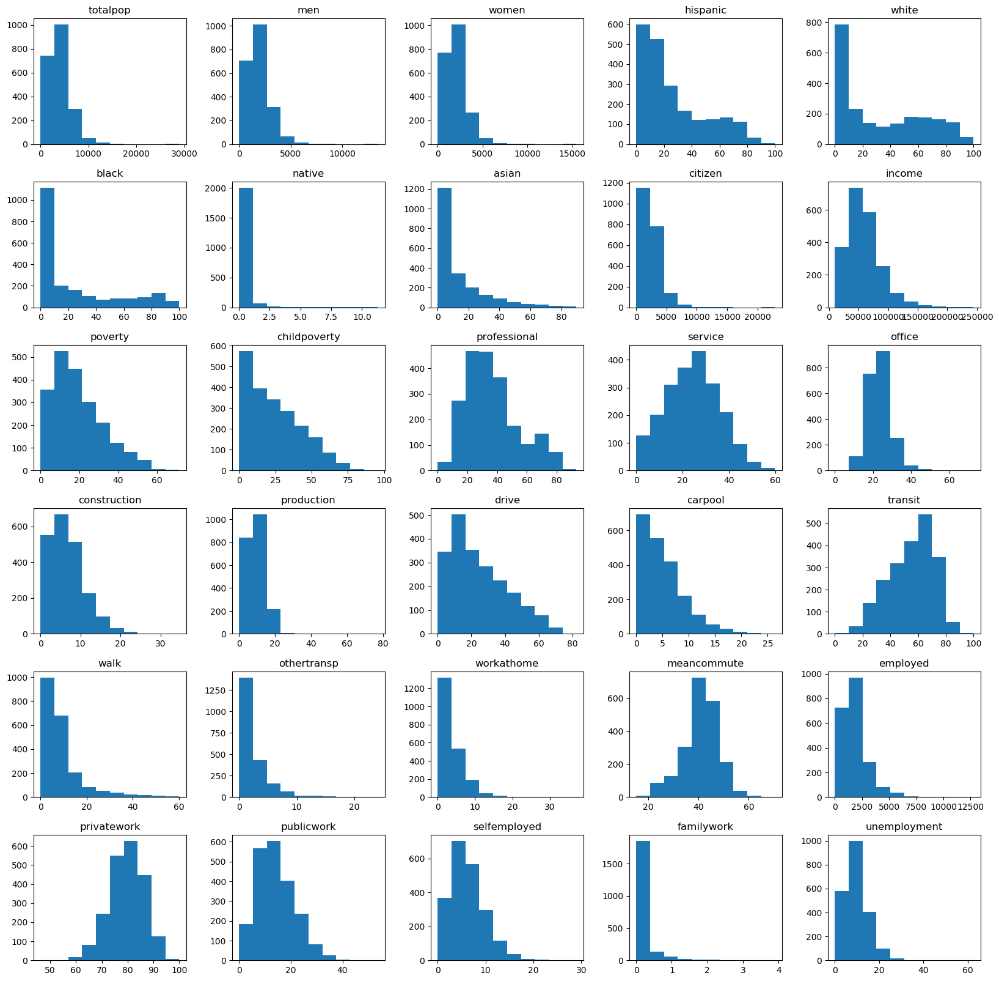

In [19]:
# histograms
cen_df01_s05.hist(grid=False, figsize=(20,20))
plt.show()

#### Create subsets of columns for various purposes

In [20]:
cen_df01_s05_num_lst01 = ['totalpop',
                          'men',
                          'women',
                          'hispanic',
                          'white',
                          'black',
                          'native',
                          'asian',
                          'citizen',
                          'income',
                          'poverty',
                          'childpoverty',
                          'professional',
                          'service',
                          'office',
                          'construction',
                          'production',
                          'drive',
                          'carpool',
                          'transit',
                          'walk',
                          'othertransp',
                          'workathome',
                          'meancommute',
                          'employed',
                          'privatework',
                          'publicwork',
                          'selfemployed',
                          'familywork',
                          'unemployment'
                         ]

cen_df01_s05_num_lst02 = ['totalpop',
                          'women',
                          'hispanic',
                          'black',
                          'native',
                          'asian',
                          'citizen',
                          'income',
                          'poverty',
                          'childpoverty',
                          'professional',
                          'service',
                          'office',
                          'construction',
                          'meancommute',
                          'employed',
                          'unemployment'
                         ]

cen_df02_s01 = cen_df01_s05[cen_df01_s05_num_lst01]
cen_df03_s01 = cen_df01_s05[cen_df01_s05_num_lst02]

display(cen_df02_s01.head(5))

,totalpop,men,women,hispanic,white,black,native,asian,citizen,income,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,...,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
1,5915,2896,3019,62.7,3.6,30.7,0.0,0.3,4100,74836.0,...,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
2,5879,2558,3321,65.1,1.6,32.4,0.0,0.0,3536,32312.0,...,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
3,2591,1206,1385,55.4,9.0,29.0,0.0,2.1,1557,37936.0,...,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2
4,8516,3301,5215,61.1,1.6,31.1,0.3,3.3,5436,18086.0,...,4.3,1.0,0.0,46.0,2508,71.0,21.3,7.7,0.0,17.2


#### Scatterplots of numerical features

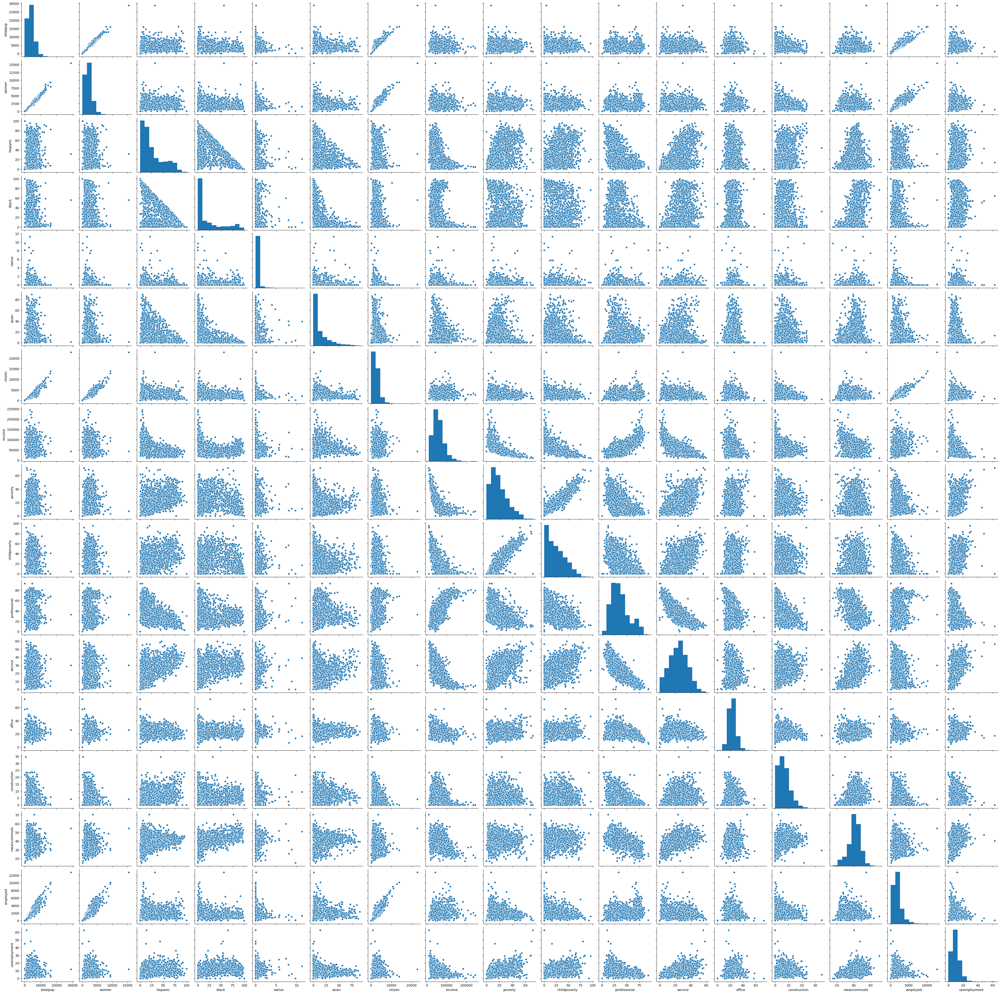

In [21]:
# Pair scatter plots for selected features
sns.pairplot(cen_df03_s01)

#### Summary stats for select features

In [22]:
sum_stat_pov = pd.DataFrame(cen_df01_s05['childpoverty'].describe()).T
sum_stat_pop = pd.DataFrame(cen_df01_s05['totalpop'].describe()).T
sum_stat_emp = pd.DataFrame(cen_df01_s05['employed'].describe()).T
sum_stat = pd.concat([sum_stat_pov, sum_stat_pop, sum_stat_emp])
sum_stat

,count,mean,std,min,25%,50%,75%,max
childpoverty,2107.0,24.483816,18.948203,0.0,8.3,21.1,37.55,95.7
totalpop,2107.0,3991.738016,2178.239166,15.0,2451.0,3622.0,5003.50,28926.0
employed,2107.0,1864.503085,1157.310756,11.0,1098.0,1612.0,2297.50,12780.0


#### Outliers for select features

In [23]:
# Child Poverty
IQR = sum_stat_pov['75%'][0] - sum_stat_pov['25%'][0]
low_outlier = sum_stat_pov['25%'][0] - 1.5*(IQR)
high_outlier = sum_stat_pov['75%'][0] + 1.5*(IQR)
print('Low Outlier (childpoverty):', low_outlier)
print('High Outlier (childpoverty):', high_outlier)

# Population
IQR_pop = sum_stat_pop['75%'][0] - sum_stat_pop['25%'][0]
low_outlier_pop = sum_stat_pop['25%'][0] - 1.5*(IQR_pop)
high_outlier_pop = sum_stat_pop['75%'][0] + 1.5*(IQR_pop)
print('Low Outlier (population):', low_outlier_pop)
print('High Outlier (population):', high_outlier_pop)

Low Outlier (childpoverty): -35.57499999999999
High Outlier (childpoverty): 81.42499999999998
Low Outlier (population): -1377.75
High Outlier (population): 8832.25


In [24]:
# Identify presence of outliers
outliers_pov = cen_df01_s05.loc[(cen_df01_s05['childpoverty'] < low_outlier) | (cen_df01_s05['childpoverty'] > high_outlier), 
                            ['borough', 'childpoverty', 'totalpop']]
if outliers_pov.empty:
    print('No outliers found in childpoverty column')
else:
    print('Outliers found in childpoverty column ({0}):'.format(len(outliers_pov)))
    print(outliers_pov)
    
outliers_pop = cen_df01_s05.loc[(cen_df01_s05['totalpop'] < low_outlier) | (cen_df01_s05['totalpop'] > high_outlier), 
                            ['borough', 'childpoverty', 'totalpop']]
if outliers_pop.empty:
    print('No outliers found in totalpop column')
else:
    print('Outliers found in totalpop column ({0}):'.format(len(outliers_pop)))
    print(outliers_pop)

Outliers found in childpoverty column (5):
            borough  childpoverty  totalpop
140           Bronx          83.4      2176
566        Brooklyn          81.7      2626
622        Brooklyn          92.0      1035
976        Brooklyn          95.7      6094
2043  Staten Island          84.0      1531
Outliers found in totalpop column (2102):
            borough  childpoverty  totalpop
0             Bronx          20.7      5403
1             Bronx          23.6      5915
2             Bronx          35.9      5879
3             Bronx          31.5      2591
4             Bronx          67.7      8516
...             ...           ...       ...
2102  Staten Island          11.1      4895
2103  Staten Island          27.8      6279
2104  Staten Island          51.4      2550
2105  Staten Island          53.8      4611
2106  Staten Island          16.5      1131

[2102 rows x 3 columns]


There are a few outliers, especially in our population data. However, these outliers still give a key insight to the differences between communities. 

#### Determine Skew for select features

In [25]:
# For 'childpoverty' column
childpoverty_skew = skew(cen_df01_s05['childpoverty'])
print('Skewness of childpoverty column:', childpoverty_skew)

# For 'population' column
totalpop_skew = skew(cen_df01_s05['totalpop'])
print('Skewness of population column:', totalpop_skew)

Skewness of childpoverty column: 0.6278449442145481
Skewness of population column: 1.888443026275476


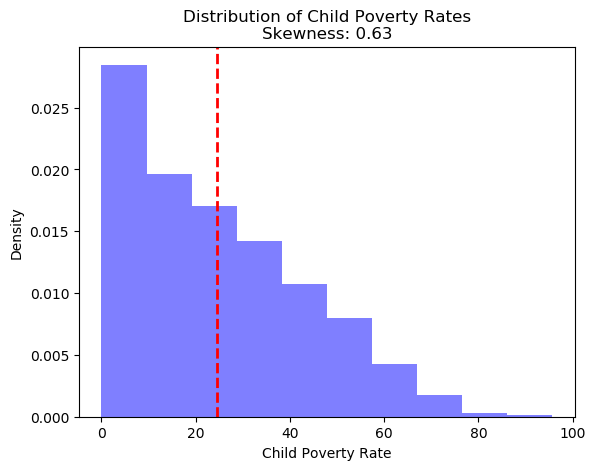

In [26]:
childpoverty_skew = skew(cen_df01_s05['childpoverty'])
plt.hist(cen_df01_s05['childpoverty'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of Child Poverty Rates\nSkewness: {0:.2f}'.format(childpoverty_skew))
plt.xlabel('Child Poverty Rate')
plt.ylabel('Density')
plt.axvline(x=cen_df01_s05['childpoverty'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

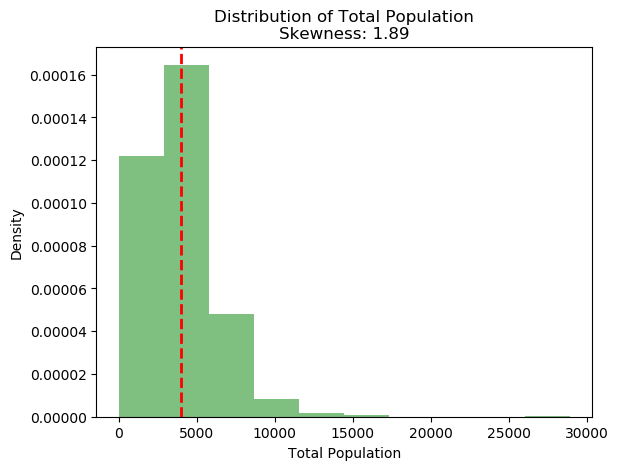

In [27]:
totalpop_skew = skew(cen_df01_s05['totalpop'])
plt.hist(cen_df01_s05['totalpop'], density=True, alpha=0.5, color='green')
plt.title('Distribution of Total Population\nSkewness: {0:.2f}'.format(totalpop_skew))
plt.xlabel('Total Population')
plt.ylabel('Density')
plt.axvline(x=cen_df01_s05['totalpop'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

#### Examine features with missing values

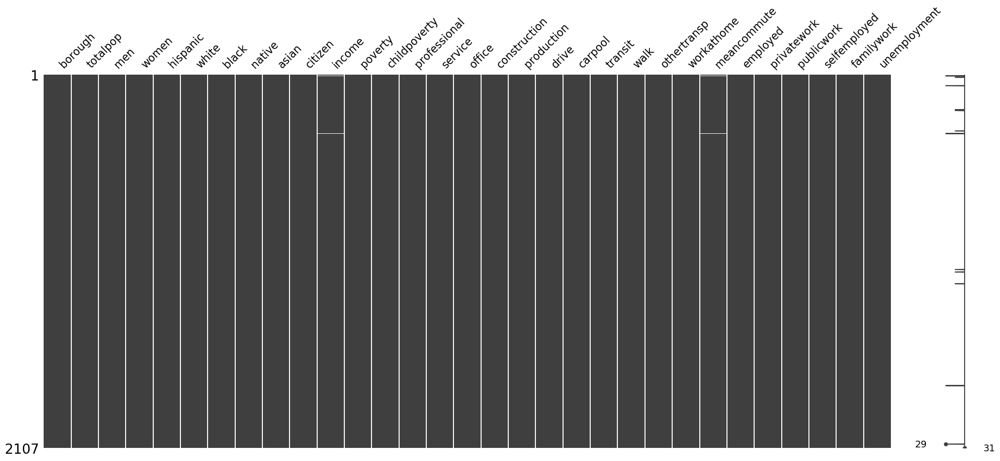

In [28]:
# Visualize missing values in each column
msno.matrix(cen_df01_s05)

In [29]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (5% of total N)
cen_df01_s05_null_summ01 = pd.DataFrame(cen_df01_s05.isnull().sum(),
                                        columns=['null_count'])

cen_df01_s05_null_summ02 = cen_df01_s05_null_summ01.loc[(cen_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
cen_df01_s05_null_summ03 = cen_df01_s05_null_summ02.reset_index()
print(cen_df01_s05_null_summ03)

cen_df01_s05_null_summ04 = cen_df01_s05_null_summ03.loc[cen_df01_s05_null_summ03['null_count'] > (len(cen_df01_s05)*.05)]
print('\n', cen_df01_s05_null_summ04)

cen_df01_s05_null_summ04_remove_lst01 = list(cen_df01_s05_null_summ04['index'])
print('\n', cen_df01_s05_null_summ04_remove_lst01)

         index  null_count
0       income          10
1  meancommute           7

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Examine featues with near zero variances

In [30]:
# Review near-zero variance (NZV) features for possible removal
cen_df02_s01_nzv_fit = VarianceThreshold().fit(cen_df02_s01)
cen_df02_s01_nzv_vc01 = cen_df02_s01_nzv_fit.transform(cen_df02_s01)

# Get the names of the selected features
cen_df02_s01_nzv_fit_select_features = cen_df02_s01.columns[cen_df02_s01_nzv_fit.get_support()]

cen_df02_s01_nzv_df01 = pd.DataFrame(cen_df02_s01_nzv_vc01,
                                     columns=cen_df02_s01_nzv_fit_select_features)

display(cen_df02_s01_nzv_df01.head(5))
print(f'NZV transformed matrix dimensions = {cen_df02_s01_nzv_df01.shape}')

print(f'\n{cen_df02_s01.shape[1] - cen_df02_s01_nzv_df01.shape[1]} near zero variance features were eliminated')

,totalpop,men,women,hispanic,white,black,native,asian,citizen,income,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,5403.0,2659.0,2744.0,75.8,2.3,16.0,0.0,4.2,3639.0,72034.0,...,2.9,0.0,0.0,43.0,2308.0,80.8,16.2,2.9,0.0,7.7
1,5915.0,2896.0,3019.0,62.7,3.6,30.7,0.0,0.3,4100.0,74836.0,...,1.4,0.5,2.1,45.0,2675.0,71.7,25.3,2.5,0.6,9.5
2,5879.0,2558.0,3321.0,65.1,1.6,32.4,0.0,0.0,3536.0,32312.0,...,8.6,1.6,1.7,38.8,2120.0,75.0,21.3,3.8,0.0,8.7
3,2591.0,1206.0,1385.0,55.4,9.0,29.0,0.0,2.1,1557.0,37936.0,...,3.0,2.4,6.2,45.4,1083.0,76.8,15.5,7.7,0.0,19.2
4,8516.0,3301.0,5215.0,61.1,1.6,31.1,0.3,3.3,5436.0,18086.0,...,4.3,1.0,0.0,46.0,2508.0,71.0,21.3,7.7,0.0,17.2


NZV transformed matrix dimensions = (2107, 30)

0 near zero variance features were eliminated


#### Correlations

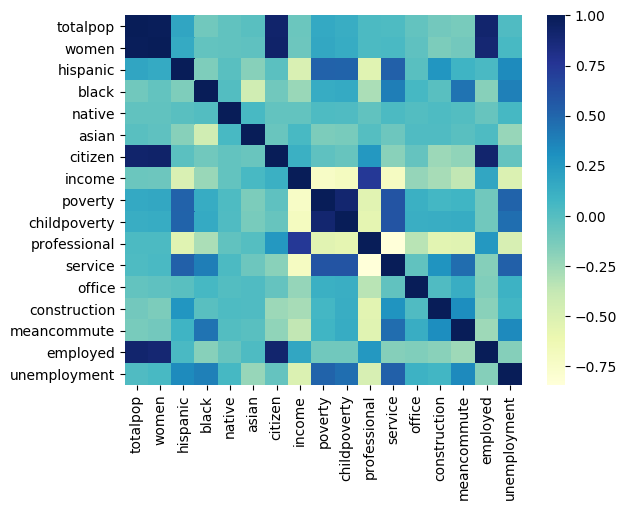

childpoverty - poverty: 0.9111736833012234
poverty     0.911174
service     0.593196
hispanic    0.516168
Name: childpoverty, dtype: float64


In [31]:
# Calculate correlation matrix
cen_corr_matrix = cen_df01_s05[cen_df01_s05_num_lst02].corr()

# Generate heatmap plot
sns.heatmap(cen_corr_matrix, cmap="YlGnBu")

# Show plot
plt.show()
cen_top_corr = cen_corr_matrix['childpoverty'].sort_values(ascending=False)[1:6]
for column in cen_top_corr.index:
    for index in cen_corr_matrix.index:
        correlation = cen_corr_matrix.loc[index, column]
        if correlation > 0.8 and correlation < 1.0:
            print(f"{index} - {column}: {correlation}")
cen_top_corr = cen_corr_matrix.nlargest(4, 'childpoverty')['childpoverty'][1:]
print(cen_top_corr)

### `crime_pqt`

In [32]:
cri_pqt_tbl_name = 'crime_pqt'

#### Explore via SQL SELECT statements

In [33]:
# Run query to review a sample of records
cri_law_cat_cd01 = "misdemeanor"
cri_bourough01 = "bronx"

cri_select_borough_stmnt01 = f"""
SELECT * FROM {database_name}.{cri_pqt_tbl_name}
WHERE LOWER(law_cat_cd) = '{cri_law_cat_cd01}'
    AND LOWER(borough) = '{cri_bourough01}'
LIMIT 11
"""

# Display SQL statement
print(cri_select_borough_stmnt01)

# Run SQL statement against Athena table
cri_df01_s01 = pd.read_sql(cri_select_borough_stmnt01,
                           conn)

# Display results
cri_df01_s01.head(5)


SELECT * FROM ads508_t8.crime_pqt
WHERE LOWER(law_cat_cd) = 'misdemeanor'
    AND LOWER(borough) = 'bronx'
LIMIT 11



,cmplnt_num,cmplnt_fr_dt,cmplnt_fr_tm,cmplnt_to_dt,cmplnt_to_tm,addr_pct_cd,rpt_dt,ky_cd,ofns_desc,pd_cd,...,latitude,longitude,lat_lon,patrol_boro,station_name,vic_age_group,vic_race,vic_sex,law_cat_cd,borough
0,303402670,08/31/2015,15:00:00,08/31/2015,15:19:00,41,08/31/2015,341,PETIT LARCENY,333,...,40.819885621,-73.901226998,"(40.819885621, -73.901226998)",PATROL BORO BRONX,,UNKNOWN,UNKNOWN,D,MISDEMEANOR,BRONX
1,874836827,02/10/2012,22:38:00,,,52,02/11/2012,364,OTHER STATE LAWS (NON PENAL LA,848,...,40.863291107,-73.889806842,"(40.863291107, -73.889806842)",PATROL BORO BRONX,,,UNKNOWN,E,MISDEMEANOR,BRONX
2,312582920,11/04/2014,18:15:00,,,52,11/04/2014,341,PETIT LARCENY,333,...,40.873671035,-73.908013649,"(40.873671035, -73.908013649)",PATROL BORO BRONX,,,UNKNOWN,D,MISDEMEANOR,BRONX
3,386959556,05/22/2007,09:00:00,10/24/2012,15:43:00,41,10/24/2012,340,FRAUDS,718,...,40.814796857,-73.901169522,"(40.814796857, -73.901169522)",PATROL BORO BRONX,,25-44,WHITE HISPANIC,F,MISDEMEANOR,BRONX
4,440172783,06/29/2013,11:30:00,06/29/2013,15:00:00,49,06/29/2013,341,PETIT LARCENY,349,...,40.857991122,-73.861791961,"(40.857991122, -73.861791961)",PATROL BORO BRONX,,25-44,BLACK,F,MISDEMEANOR,BRONX


#### Perform aggregated summaries

In [34]:
# Run query to review a sample of records
cri_select_ofns_desc_stmnt01 = f"""
SELECT DISTINCT
    ofns_desc,
    COUNT(*) AS misdemeanor_offense_count
FROM {database_name}.{cri_pqt_tbl_name}
WHERE LOWER(law_cat_cd) = '{cri_law_cat_cd01}' 
GROUP BY ofns_desc
ORDER BY misdemeanor_offense_count DESC
LIMIT 1000
"""

# Display SQL statement
print(cri_select_ofns_desc_stmnt01)

# Run SQL statement against Athena table
cri_df01_s02 = pd.read_sql(cri_select_ofns_desc_stmnt01,
                           conn)

# Display results
cri_df01_s02.head(31)


SELECT DISTINCT
    ofns_desc,
    COUNT(*) AS misdemeanor_offense_count
FROM ads508_t8.crime_pqt
WHERE LOWER(law_cat_cd) = 'misdemeanor' 
GROUP BY ofns_desc
ORDER BY misdemeanor_offense_count DESC
LIMIT 1000



,ofns_desc,misdemeanor_offense_count
0,PETIT LARCENY,26757
1,ASSAULT 3 & RELATED OFFENSES,16477
2,CRIMINAL MISCHIEF & RELATED OF,13000
3,OFF. AGNST PUB ORD SENSBLTY &,7943
4,DANGEROUS DRUGS,6840
5,OFFENSES AGAINST PUBLIC ADMINI,2807
6,VEHICLE AND TRAFFIC LAWS,2006
7,INTOXICATED & IMPAIRED DRIVING,1897
8,DANGEROUS WEAPONS,1715
9,CRIMINAL TRESPASS,1643


In [35]:
cri_summ_borough_stmnt01 = f"""
SELECT
    law_cat_cd,
    borough,
    COUNT(*) AS crime_count
FROM {database_name}.{cri_pqt_tbl_name}
GROUP BY law_cat_cd, borough
ORDER BY crime_count DESC
LIMIT 100
"""

# Display SQL statement
print(cri_summ_borough_stmnt01)

# Run SQL statement against Athena table
cri_df01_s03 = pd.read_sql(cri_summ_borough_stmnt01,
                           conn)

# Display results
cri_df01_s03.head(47)


SELECT
    law_cat_cd,
    borough,
    COUNT(*) AS crime_count
FROM ads508_t8.crime_pqt
GROUP BY law_cat_cd, borough
ORDER BY crime_count DESC
LIMIT 100



,law_cat_cd,borough,crime_count
0,MISDEMEANOR,BROOKLYN,24820
1,MISDEMEANOR,MANHATTAN,21534
2,MISDEMEANOR,BRONX,19885
3,MISDEMEANOR,QUEENS,16389
4,FELONY,BROOKLYN,15236
5,FELONY,MANHATTAN,12106
6,FELONY,QUEENS,10388
7,FELONY,BRONX,9340
8,VIOLATION,BROOKLYN,6065
9,VIOLATION,BRONX,4516


In [36]:
cri_date_stmnt01 = f"""
SELECT
    cmplnt_fr_dt,
    DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y') AS cmplnt_fr_date,
    COUNT(*) AS daily_misdemeanor_counts
FROM {database_name}.{cri_pqt_tbl_name}
WHERE LOWER(law_cat_cd) = '{cri_law_cat_cd01}'
    AND cmplnt_fr_dt <> ''
GROUP BY cmplnt_fr_dt
ORDER BY cmplnt_fr_dt
LIMIT 10000
"""

# Display SQL statement
print(cri_date_stmnt01)

# Run SQL statement against Athena table
cri_df01_s04 = pd.read_sql(cri_date_stmnt01,
                           conn)

# Display results
print(cri_df01_s04.shape)
display(cri_df01_s04.head(11))


SELECT
    cmplnt_fr_dt,
    DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y') AS cmplnt_fr_date,
    COUNT(*) AS daily_misdemeanor_counts
FROM ads508_t8.crime_pqt
WHERE LOWER(law_cat_cd) = 'misdemeanor'
    AND cmplnt_fr_dt <> ''
GROUP BY cmplnt_fr_dt
ORDER BY cmplnt_fr_dt
LIMIT 10000

(5957, 3)


,cmplnt_fr_dt,cmplnt_fr_date,daily_misdemeanor_counts
0,01/01/1986,1986-01-01 00:00:00,1
1,01/01/1994,1994-01-01 00:00:00,2
2,01/01/2000,2000-01-01 00:00:00,1
3,01/01/2002,2002-01-01 00:00:00,2
4,01/01/2003,2003-01-01 00:00:00,1
5,01/01/2004,2004-01-01 00:00:00,2
6,01/01/2005,2005-01-01 00:00:00,1
7,01/01/2006,2006-01-01 00:00:00,21
8,01/01/2007,2007-01-01 00:00:00,21
9,01/01/2008,2008-01-01 00:00:00,25


#### Load potential predictors and target for further exploration using pandas

In [37]:
cri_box_stmnt01 = f"""
SELECT
    cmplnt_fr_dt,
    ky_cd,
    ofns_desc,
    pd_cd,
    pd_desc,
    crm_atpt_cptd_cd,
    loc_of_occur_desc,
    prem_typ_desc,
    jurisdiction_code,
    parks_nm,
    susp_age_group,
    susp_race,
    susp_sex,
    transit_district,
    latitude,
    longitude,
    vic_age_group,
    vic_race,
    vic_sex,
    law_cat_cd,
    borough
FROM {database_name}.{cri_pqt_tbl_name}
WHERE LOWER(law_cat_cd) = '{cri_law_cat_cd01}'
    AND LOWER(borough) = '{cri_bourough01}'
"""

# Display SQL statement
print(cri_box_stmnt01)

# Run SQL statement against Athena table
cri_df01_s05 = pd.read_sql(cri_box_stmnt01,
                           conn)

# Display results
print(cri_df01_s05.shape)
display(cri_df01_s05.head(11))


SELECT
    cmplnt_fr_dt,
    ky_cd,
    ofns_desc,
    pd_cd,
    pd_desc,
    crm_atpt_cptd_cd,
    loc_of_occur_desc,
    prem_typ_desc,
    jurisdiction_code,
    parks_nm,
    susp_age_group,
    susp_race,
    susp_sex,
    transit_district,
    latitude,
    longitude,
    vic_age_group,
    vic_race,
    vic_sex,
    law_cat_cd,
    borough
FROM ads508_t8.crime_pqt
WHERE LOWER(law_cat_cd) = 'misdemeanor'
    AND LOWER(borough) = 'bronx'

(19885, 21)


,cmplnt_fr_dt,ky_cd,ofns_desc,pd_cd,pd_desc,crm_atpt_cptd_cd,loc_of_occur_desc,prem_typ_desc,jurisdiction_code,parks_nm,...,susp_race,susp_sex,transit_district,latitude,longitude,vic_age_group,vic_race,vic_sex,law_cat_cd,borough
0,07/19/2007,341,PETIT LARCENY,338,"LARCENY,PETIT FROM BUILDING,UN",COMPLETED,INSIDE,OTHER,0,NA,...,,,,40.817145307,-73.917289974,45-64,WHITE,F,MISDEMEANOR,BRONX
1,09/13/2007,235,DANGEROUS DRUGS,511,"CONTROLLED SUBSTANCE, POSSESSI",COMPLETED,,STREET,0,NA,...,,,,40.815370918,-73.886699777,,UNKNOWN,E,MISDEMEANOR,BRONX
2,05/05/2010,341,PETIT LARCENY,303,"LARCENY,PETIT BY CHECK USE",COMPLETED,INSIDE,RESIDENCE - APT. HOUSE,0,NA,...,,,,40.829392231,-73.890878366,25-44,BLACK,M,MISDEMEANOR,BRONX
3,02/03/2010,341,PETIT LARCENY,321,"LARCENY,PETIT FROM AUTO",COMPLETED,FRONT OF,STREET,0,NA,...,,,,40.839273869,-73.858632449,25-44,BLACK,M,MISDEMEANOR,BRONX
4,01/29/2008,344,ASSAULT 3 & RELATED OFFENSES,101,ASSAULT 3,COMPLETED,INSIDE,RESIDENCE-HOUSE,0,NA,...,,,,40.853659938,-73.895704056,25-44,WHITE HISPANIC,F,MISDEMEANOR,BRONX
5,08/23/2007,235,DANGEROUS DRUGS,567,"MARIJUANA, POSSESSION 4 & 5",COMPLETED,FRONT OF,STREET,0,NA,...,,,,40.831240768,-73.91917319,,UNKNOWN,E,MISDEMEANOR,BRONX
6,03/21/2011,235,DANGEROUS DRUGS,567,"MARIJUANA, POSSESSION 4 & 5",COMPLETED,,STREET,0,NA,...,,,,40.829510182,-73.874610305,,UNKNOWN,E,MISDEMEANOR,BRONX
7,08/12/2017,351,CRIMINAL MISCHIEF & RELATED OF,259,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",COMPLETED,FRONT OF,RESIDENCE-HOUSE,0,,...,,,,40.841382062,-73.897880935,45-64,WHITE HISPANIC,F,MISDEMEANOR,BRONX
8,03/11/2012,341,PETIT LARCENY,321,"LARCENY,PETIT FROM AUTO",COMPLETED,,STREET,0,NA,...,,,,40.811358688,-73.924193405,45-64,BLACK,M,MISDEMEANOR,BRONX
9,04/22/2014,341,PETIT LARCENY,333,"LARCENY,PETIT FROM STORE-SHOPL",COMPLETED,INSIDE,DEPARTMENT STORE,0,,...,,,,40.837323511,-73.919830757,,UNKNOWN,D,MISDEMEANOR,BRONX


#### Plots for Various Features

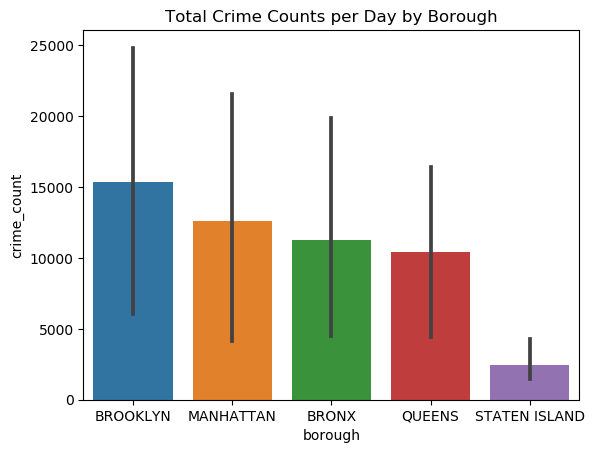

In [38]:
pqt_bar = sns.barplot(x='borough',
                      y='crime_count',
                      data=cri_df01_s03).set(title='Total Crime Counts per Day by Borough')

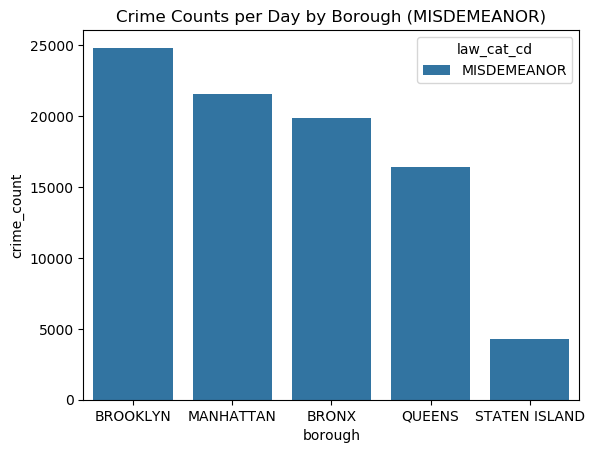

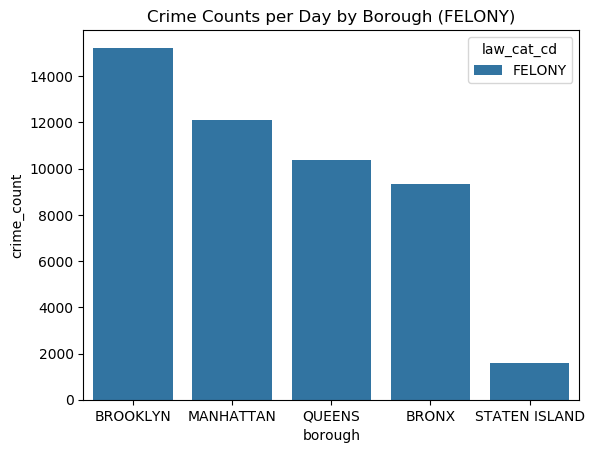

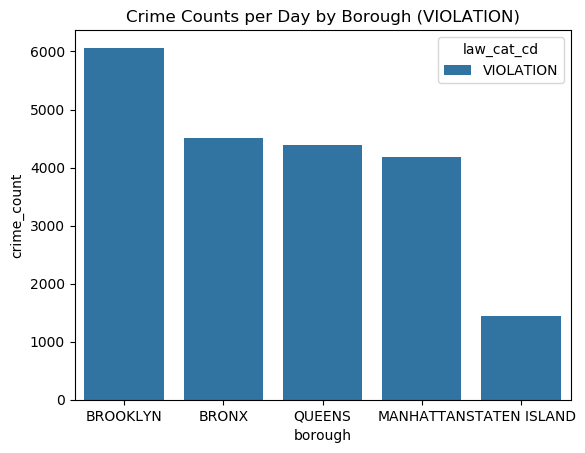

In [39]:
for law_cat in cri_df01_s03['law_cat_cd'].unique():
    sns.barplot(x='borough',
                y='crime_count',
                data=cri_df01_s03[cri_df01_s03['law_cat_cd']==law_cat],
                hue='law_cat_cd')
    plt.title(f'Crime Counts per Day by Borough ({law_cat})')
    plt.show()

#### Create subsets of columns for various purposes

In [40]:
cri_df01_s05_num_lst01 = []

cri_df01_s05_num_lst02 = []

cri_df02_s01 = cri_df01_s05[cri_df01_s05_num_lst01]
cri_df03_s01 = cri_df01_s05[cri_df01_s05_num_lst02]

display(cri_df02_s01.head(11))

""
0
1
2
3
4
5
6
7
8
9


#### Examine features with missing values

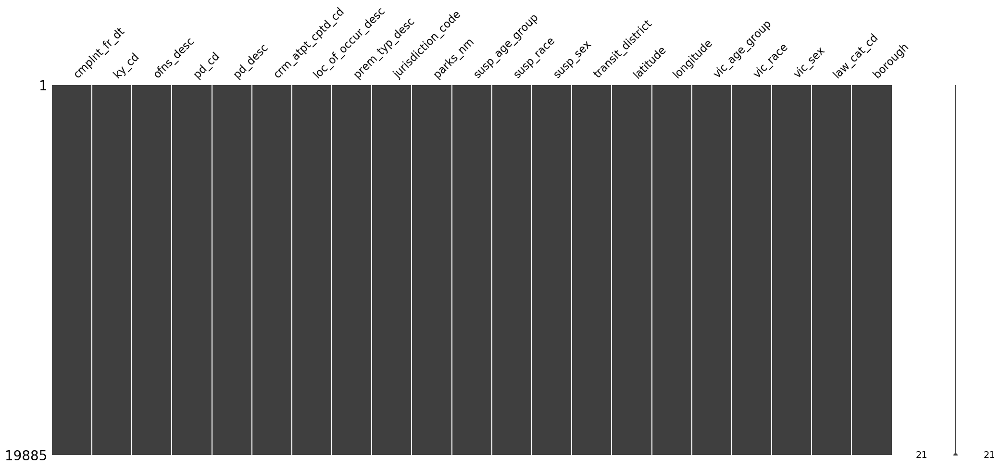

In [41]:
# Visualize missing values in each column
msno.matrix(cri_df01_s05)

In [42]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (5% of total N)
cri_df01_s05_null_summ01 = pd.DataFrame(cri_df01_s05.isnull().sum(),
                                        columns=['null_count'])

cri_df01_s05_null_summ02 = cri_df01_s05_null_summ01.loc[(cri_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
cri_df01_s05_null_summ03 = cri_df01_s05_null_summ02.reset_index()
print(cri_df01_s05_null_summ03)

cri_df01_s05_null_summ04 = cri_df01_s05_null_summ03.loc[cri_df01_s05_null_summ03['null_count'] > (len(cri_df01_s05)*.05)]
print('\n', cri_df01_s05_null_summ04)

cri_df01_s05_null_summ04_remove_lst01 = list(cri_df01_s05_null_summ04['index'])
print('\n', cri_df01_s05_null_summ04_remove_lst01)

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Display time plots for select features

In [43]:
cri_date_stmnt02 = f"""
SELECT
    cmplnt_fr_dt,
    DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y') AS cmplnt_fr_date,
    COUNT(*) AS daily_misdemeanor_counts
FROM {database_name}.{cri_pqt_tbl_name}
WHERE LOWER(law_cat_cd) = '{cri_law_cat_cd01}'
    AND cmplnt_fr_dt <> ''
    AND YEAR(DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y')) BETWEEN 2017 AND 2021
GROUP BY cmplnt_fr_dt
ORDER BY DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y')
LIMIT 10000
"""

# Display SQL statement
print(cri_date_stmnt02)

# Run SQL statement against Athena table
cri_df01_s14 = pd.read_sql(cri_date_stmnt02,
                           conn)

# Display results
print(cri_df01_s14.shape)
display(cri_df01_s14.head(11))


SELECT
    cmplnt_fr_dt,
    DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y') AS cmplnt_fr_date,
    COUNT(*) AS daily_misdemeanor_counts
FROM ads508_t8.crime_pqt
WHERE LOWER(law_cat_cd) = 'misdemeanor'
    AND cmplnt_fr_dt <> ''
    AND YEAR(DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y')) BETWEEN 2017 AND 2021
GROUP BY cmplnt_fr_dt
ORDER BY DATE_PARSE(cmplnt_fr_dt, '%m/%d/%Y')
LIMIT 10000

(1826, 3)


,cmplnt_fr_dt,cmplnt_fr_date,daily_misdemeanor_counts
0,01/01/2017,2017-01-01,33
1,01/02/2017,2017-01-02,14
2,01/03/2017,2017-01-03,12
3,01/04/2017,2017-01-04,24
4,01/05/2017,2017-01-05,12
5,01/06/2017,2017-01-06,17
6,01/07/2017,2017-01-07,11
7,01/08/2017,2017-01-08,7
8,01/09/2017,2017-01-09,11
9,01/10/2017,2017-01-10,12


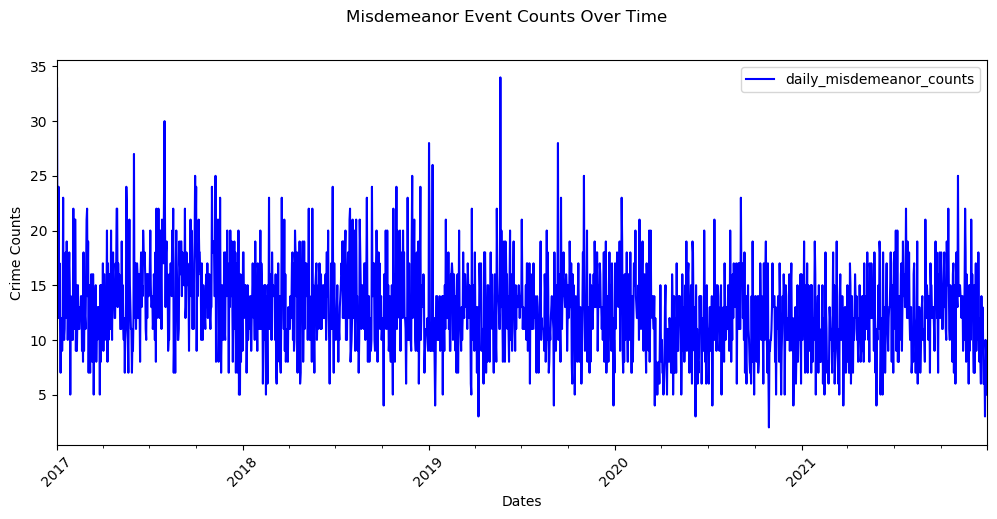

In [44]:
fig = plt.gcf()
fig.set_size_inches(12, 5)

fig.suptitle("Misdemeanor Event Counts Over Time")

ax = plt.gca()
# ax = plt.gca().set_xticks(df['year'])
ax.locator_params(integer=True)
ax.set_xticks(cri_df01_s14["cmplnt_fr_date"].unique())

cri_df01_s14.plot(kind="line",
        x="cmplnt_fr_date",
        y='daily_misdemeanor_counts',
        color="blue",
        ax=ax)

# plt.xticks(range(1995, 2016, 1))
# plt.yticks(range(0,6,1))
plt.xlabel("Dates")
plt.ylabel("Crime Counts")
plt.xticks(rotation=45)

# fig.savefig('average-rating.png', dpi=300)
plt.show()

#### Summary stats for select features

In [45]:
sum_stat_cri = pd.DataFrame(cri_df01_s04['daily_misdemeanor_counts'].describe()).T
sum_stat_cri

,count,mean,std,min,25%,50%,75%,max
daily_misdemeanor_counts,5957.0,14.597281,4.894023,1.0,11.0,14.0,18.0,34.0


#### Outliers and Skew Exploration

#### Outliers for select features

In [46]:
# Population
IQR_cri = sum_stat_cri['75%'][0] - sum_stat_cri['25%'][0]
low_outlier_cri = sum_stat_cri['25%'][0] - 1.5*(IQR_cri)
high_outlier_cri = sum_stat_cri['75%'][0] + 1.5*(IQR_cri)
print('Low Outlier (daily_misdemeanor_counts):', low_outlier_cri)
print('High Outlier (daily_misdemeanor_counts):', high_outlier_cri)

Low Outlier (daily_misdemeanor_counts): 0.5
High Outlier (daily_misdemeanor_counts): 28.5


In [47]:
# Identify presence of outliers
outliers_cri = cri_df01_s04.loc[(cri_df01_s04['daily_misdemeanor_counts'] < low_outlier) | (cri_df01_s04['daily_misdemeanor_counts'] > high_outlier), 
                            ['daily_misdemeanor_counts']]
if outliers_cri.empty:
    print('No outliers found in daily_misdemeanor_counts column')
else:
    print('Outliers found in daily_misdemeanor_counts column ({0}):'.format(len(outliers_cri)))
    print(outliers_cri)

No outliers found in daily_misdemeanor_counts column


#### Determine Skew for select features

In [48]:
# For 'Misdemeanor' column
daily_misdemeanor_skew = skew(cri_df01_s04['daily_misdemeanor_counts'])
print('Skewness of daily_misdemeanor_counts column:', daily_misdemeanor_skew)

Skewness of daily_misdemeanor_counts column: -0.004203175300970424


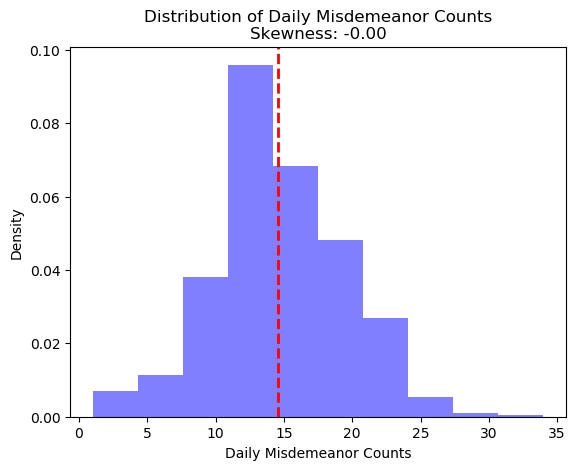

In [49]:
plt.hist(cri_df01_s04['daily_misdemeanor_counts'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of Daily Misdemeanor Counts\nSkewness: {0:.2f}'.format(daily_misdemeanor_skew))
plt.xlabel('Daily Misdemeanor Counts')
plt.ylabel('Density')
plt.axvline(x=cri_df01_s04['daily_misdemeanor_counts'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

### `evictions`

In [50]:
evi_tsv_tbl_name = 'evictions'

#### Explore via SQL SELECT statements

In [51]:
# Run query to review a sample of records
evi_bourough01 = "bronx"

evi_select_borough_stmnt01 = f"""
SELECT * FROM {database_name}.{evi_tsv_tbl_name}
WHERE LOWER(borough) = '{evi_bourough01}'
LIMIT 11
"""

# Display SQL statement
print(evi_select_borough_stmnt01)

# Run SQL statement against Athena table
evi_df01_s01 = pd.read_sql(evi_select_borough_stmnt01,
                           conn)

# Display results
evi_df01_s01.head(11)


SELECT * FROM ads508_t8.evictions
WHERE LOWER(borough) = 'bronx'
LIMIT 11



,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,marshal_first_name,marshal_last_name,residential_or_commercial,borough,eviction_postcode,ejectment,eviction_or_legal_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta
0,56037/17,339568,547 EAST 168TH STREET,3H,02/26/2018,Thomas,Bia,Residential,BRONX,10456,Not an Ejectment,Possession,40.830857,-73.905191,3,16,145,2004227,2026100065,Claremont-Bathgate
1,B047517/19,409031,4014 CARPENTER AVENUE,4B,11/16/2022,Richard,McCoy,Residential,BRONX,10466,Not an Ejectment,Possession,40.889878,-73.862686,12,12,408,2063060,2048280031,Williamsbridge-Olinville
2,15068/17,334442,655 EAST 224TH STREET,1,09/29/2017,Thomas,Bia,Residential,BRONX,10467,Not an Ejectment,Possession,40.887599,-73.862391,12,12,394,2062985,2048260028,Williamsbridge-Olinville
3,14866/19A,097278,718 PENFIELD STREET,2-F,10/24/2019,Justin,Grossman,Residential,BRONX,10470,Not an Ejectment,Possession,40.904888,-73.849089,12,11,442,2071873,2051130039,Woodlawn-Wakefield
4,66703/18BX,090391,2032 EAST 177TH ST A /K/A 2032 CROSS BRONX EXP...,1E,07/30/2019,Justin,Grossman,Residential,BRONX,10472,Not an Ejectment,Possession,40.831685,-73.856168,9,18,78,2026230,2038030019,Westchester-Unionport
5,B806500/18,396012,281 EAST 143RD STREET,07A,01/17/2019,Richard,McCoy,Residential,BRONX,10451,Not an Ejectment,Possession,40.814845,-73.924083,1,8,51,2091116,2023240001,Mott Haven-Port Morris
6,54026/17,341956,1211 SOUTHERN BOULEVARD,301,11/19/2018,Thomas,Bia,Residential,BRONX,10459,Not an Ejectment,Possession,40.828949,-73.891897,3,17,125,2113777,2029750037,Morrisania-Melrose
7,69137/18,10335,1351 BOSTON ROAD - APT 201,201,07/15/2019,Robert,Renzulli,Residential,BRONX,10456,Not an Ejectment,Possession,40.832166,-73.898808,3,16,151,2128618,2029340050,Morrisania-Melrose
8,18348/16,324092,2280 LORING PLACE NORTH,4B,05/22/2017,Thomas,Bia,Residential,BRONX,10468,Not an Ejectment,Possession,40.861277,-73.908723,7,14,255,2014918,2032250015,Kingsbridge Heights
9,75943/16A,060118,1551 WILLIAMSBRID GE ROAD,4-B,08/10/2017,Justin,Grossman,Residential,BRONX,10461,Not an Ejectment,Possession,,,,,,,,


#### Perform aggregated summaries

In [52]:
# Run query to review a sample of records
evi_select_eviction_postcode_stmnt01 = f"""
SELECT DISTINCT
    eviction_postcode,
    COUNT(*)
FROM {database_name}.{evi_tsv_tbl_name}
GROUP BY eviction_postcode
LIMIT 1000
"""

# Display SQL statement
print(evi_select_eviction_postcode_stmnt01)

# Run SQL statement against Athena table
evi_df01_s02 = pd.read_sql(evi_select_eviction_postcode_stmnt01,
                           conn)

# Display results
evi_df01_s02.head(11)


SELECT DISTINCT
    eviction_postcode,
    COUNT(*)
FROM ads508_t8.evictions
GROUP BY eviction_postcode
LIMIT 1000



,eviction_postcode,_col1
0,10466,1248
1,10451,980
2,11220,354
3,10468,1461
4,10030,442
5,10075,74
6,11354,385
7,10309,93
8,11249,125
9,11433,513


In [53]:
evi_summ_borough_stmnt01 = f"""
SELECT
    borough,
    COUNT(*) AS evictions_count
FROM {database_name}.{evi_tsv_tbl_name}
GROUP BY borough
LIMIT 100
"""

# Display SQL statement
print(evi_summ_borough_stmnt01)

# Run SQL statement against Athena table
evi_df01_s03 = pd.read_sql(evi_summ_borough_stmnt01,
                           conn)

# Display results
evi_df01_s03.head(11)


SELECT
    borough,
    COUNT(*) AS evictions_count
FROM ads508_t8.evictions
GROUP BY borough
LIMIT 100



,borough,evictions_count
0,QUEENS,14082
1,MANHATTAN,11321
2,BROOKLYN,21066
3,STATEN ISLAND,2500
4,BRONX,23519


In [54]:
evi_summ_borough_stmnt01 = f"""
SELECT
    borough,
    census_tract,
    COUNT(*) AS ctract_count
FROM {database_name}.{evi_tsv_tbl_name}
GROUP BY borough, census_tract
LIMIT 100
"""

# Display SQL statement
print(evi_summ_borough_stmnt01)

# Run SQL statement against Athena table
evi_df01_s04 = pd.read_sql(evi_summ_borough_stmnt01,
                           conn)

# Display results
evi_df01_s04.head(11)


SELECT
    borough,
    census_tract,
    COUNT(*) AS ctract_count
FROM ads508_t8.evictions
GROUP BY borough, census_tract
LIMIT 100



,borough,census_tract,ctract_count
0,BRONX,408,145
1,BRONX,442,119
2,BROOKLYN,23,19
3,MANHATTAN,214,101
4,BRONX,387,111
5,BROOKLYN,1104,55
6,MANHATTAN,24302,53
7,QUEENS,77908,104
8,BROOKLYN,764,39
9,BROOKLYN,36501,40


In [55]:
evi_date_stmnt01 = f"""
SELECT
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM {database_name}.{evi_tsv_tbl_name}
WHERE executed_date <> ''
GROUP BY executed_date
ORDER BY executed_date
LIMIT 10000
"""

# Display SQL statement
print(evi_date_stmnt01)

# Run SQL statement against Athena table
evi_df01_s06 = pd.read_sql(evi_date_stmnt01,
                           conn)
# Display results
print(evi_df01_s06.shape)
display(evi_df01_s06.head(11))


SELECT
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM ads508_t8.evictions
WHERE executed_date <> ''
GROUP BY executed_date
ORDER BY executed_date
LIMIT 10000

(1152, 3)


,executed_date,evi_date,daily_eviction_counts
0,01/02/2018,2018-01-02,30
1,01/02/2019,2019-01-02,61
2,01/02/2020,2020-01-02,66
3,01/03/2017,2017-01-03,102
4,01/03/2018,2018-01-03,150
5,01/03/2019,2019-01-03,136
6,01/03/2020,2020-01-03,81
7,01/03/2022,2022-01-03,18
8,01/03/2023,2023-01-03,44
9,01/04/2017,2017-01-04,144


In [56]:
#Adding in borough
evi_date_stmnt01_borough = f"""
SELECT
    borough,
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM {database_name}.{evi_tsv_tbl_name}
WHERE executed_date <> ''
GROUP BY borough, executed_date
ORDER BY borough, executed_date
LIMIT 10000
"""

# Display SQL statement
print(evi_date_stmnt01_borough)

# Run SQL statement against Athena table
evi_df01_s06_borough = pd.read_sql(evi_date_stmnt01_borough,
                           conn)

# Display results
print(evi_df01_s06_borough.shape)
display(evi_df01_s06_borough.head(11))


SELECT
    borough,
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM ads508_t8.evictions
WHERE executed_date <> ''
GROUP BY borough, executed_date
ORDER BY borough, executed_date
LIMIT 10000

(4966, 4)


,borough,executed_date,evi_date,daily_eviction_counts
0,BRONX,01/02/2018,2018-01-02,10
1,BRONX,01/02/2019,2019-01-02,23
2,BRONX,01/02/2020,2020-01-02,23
3,BRONX,01/03/2017,2017-01-03,39
4,BRONX,01/03/2018,2018-01-03,68
5,BRONX,01/03/2019,2019-01-03,55
6,BRONX,01/03/2020,2020-01-03,21
7,BRONX,01/03/2022,2022-01-03,4
8,BRONX,01/03/2023,2023-01-03,1
9,BRONX,01/04/2017,2017-01-04,44


In [57]:
#Adding in eviction_postcode
evi_date_stmnt01_post = f"""
SELECT
    eviction_postcode,
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM {database_name}.{evi_tsv_tbl_name}
WHERE executed_date <> ''
GROUP BY eviction_postcode, executed_date
ORDER BY eviction_postcode, executed_date
LIMIT 10000
"""

# Display SQL statement
print(evi_date_stmnt01_post)

# Run SQL statement against Athena table
evi_df01_s06_post = pd.read_sql(evi_date_stmnt01_post,
                           conn)

# Display results
print(evi_df01_s06_post.shape)
display(evi_df01_s06_post.head(11))


SELECT
    eviction_postcode,
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM ads508_t8.evictions
WHERE executed_date <> ''
GROUP BY eviction_postcode, executed_date
ORDER BY eviction_postcode, executed_date
LIMIT 10000

(10000, 4)


,eviction_postcode,executed_date,evi_date,daily_eviction_counts
0,00000,04/19/2018,2018-04-19,1
1,00000,07/13/2018,2018-07-13,1
2,00000,08/23/2018,2018-08-23,1
3,01000,05/18/2017,2017-05-18,1
4,10000,07/30/2019,2019-07-30,1
5,10001,01/03/2019,2019-01-03,1
6,10001,01/03/2022,2022-01-03,1
7,10001,01/05/2017,2017-01-05,3
8,10001,01/05/2023,2023-01-05,1
9,10001,01/06/2017,2017-01-06,1


#### Load potential predictors and target for further exploration using pandas

In [58]:
evi_box_stmnt01 = f"""
SELECT
    court_index_number,
    docket_number,
    eviction_address,
    eviction_apartment_number,
    executed_date,
    marshal_first_name,
    marshal_last_name,
    residential_or_commercial,
    borough,
    eviction_postcode,
    ejectment,
    eviction_or_legal_possession,
    latitude,
    longitude,
    census_tract
FROM {database_name}.{evi_tsv_tbl_name}
LIMIT 5000
"""

# Display SQL statement
print(evi_box_stmnt01)

# Run SQL statement against Athena table
evi_df01_s05 = pd.read_sql(evi_box_stmnt01,
                           conn)

# Display results
evi_df01_s05.head(11)


SELECT
    court_index_number,
    docket_number,
    eviction_address,
    eviction_apartment_number,
    executed_date,
    marshal_first_name,
    marshal_last_name,
    residential_or_commercial,
    borough,
    eviction_postcode,
    ejectment,
    eviction_or_legal_possession,
    latitude,
    longitude,
    census_tract
FROM ads508_t8.evictions
LIMIT 5000



,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,marshal_first_name,marshal_last_name,residential_or_commercial,borough,eviction_postcode,ejectment,eviction_or_legal_possession,latitude,longitude,census_tract
0,56037/17,339568,547 EAST 168TH STREET,3H,02/26/2018,Thomas,Bia,Residential,BRONX,10456,Not an Ejectment,Possession,40.830857,-73.905191,145
1,B047517/19,409031,4014 CARPENTER AVENUE,4B,11/16/2022,Richard,McCoy,Residential,BRONX,10466,Not an Ejectment,Possession,40.889878,-73.862686,408
2,15068/17,334442,655 EAST 224TH STREET,1,09/29/2017,Thomas,Bia,Residential,BRONX,10467,Not an Ejectment,Possession,40.887599,-73.862391,394
3,58273/18,025388,1551 DEAN STREET,1ST FLOOR,07/12/2018,Gary,Rose,Residential,BROOKLYN,11213,Not an Ejectment,Possession,40.676166,-73.936661,311
4,14866/19A,097278,718 PENFIELD STREET,2-F,10/24/2019,Justin,Grossman,Residential,BRONX,10470,Not an Ejectment,Possession,40.904888,-73.849089,442
5,66703/18BX,090391,2032 EAST 177TH ST A /K/A 2032 CROSS BRONX EXP...,1E,07/30/2019,Justin,Grossman,Residential,BRONX,10472,Not an Ejectment,Possession,40.831685,-73.856168,78
6,98925/17,075402,175 WOODRUFF AVENUE,GARDEN APARTMENT,06/01/2018,Justin,Grossman,Residential,BROOKLYN,11226,Not an Ejectment,Possession,40.654641,-73.960291,50803
7,304057/20,107717,555 TENTH AVENUE,32I,04/18/2022,Justin,Grossman,Residential,MANHATTAN,10018,Not an Ejectment,Possession,40.758888,-73.996022,117
8,210706/18,085502,2201 FIRST AVENUE,05B,03/14/2019,Henry,Daley,Residential,MANHATTAN,10029,Not an Ejectment,Possession,40.794176,-73.936754,180
9,B806500/18,396012,281 EAST 143RD STREET,07A,01/17/2019,Richard,McCoy,Residential,BRONX,10451,Not an Ejectment,Possession,40.814845,-73.924083,51


#### Create subsets of columns for various purposes

In [59]:
evi_df01_s05_num_lst01 = []

evi_df01_s05_num_lst02 = []

evi_df02_s01 = evi_df01_s05[evi_df01_s05_num_lst01]
evi_df03_s01 = evi_df01_s05[evi_df01_s05_num_lst02]

display(evi_df02_s01.head(5))

""
0
1
2
3
4


#### Examine features with missing values

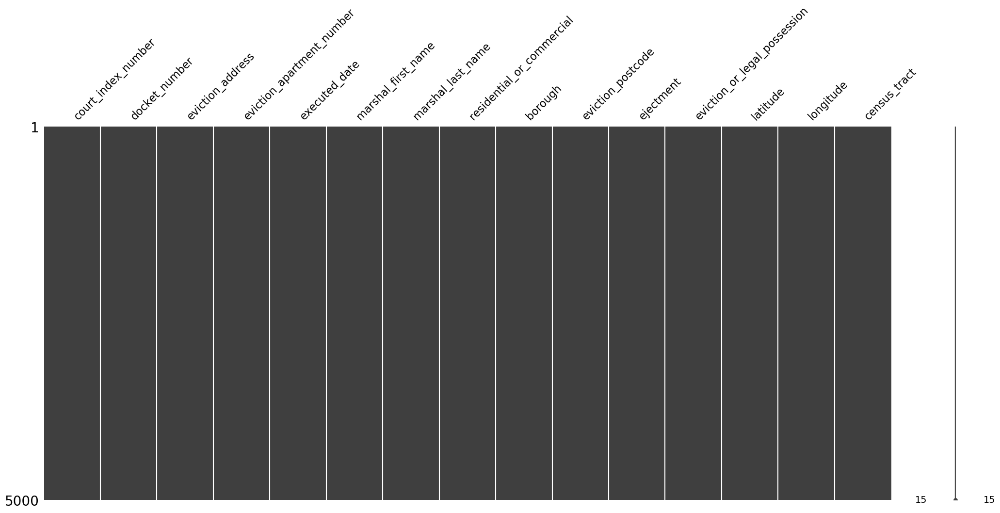

In [60]:
# Visualize missing values in each column
msno.matrix(evi_df01_s05)

In [61]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (5% of total N)
evi_df01_s05_null_summ01 = pd.DataFrame(evi_df01_s05.isnull().sum(),
                                        columns=['null_count'])

evi_df01_s05_null_summ02 = evi_df01_s05_null_summ01.loc[(evi_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
evi_df01_s05_null_summ03 = evi_df01_s05_null_summ02.reset_index()
print(evi_df01_s05_null_summ03)

evi_df01_s05_null_summ04 = evi_df01_s05_null_summ03.loc[evi_df01_s05_null_summ03['null_count'] > (len(evi_df01_s05)*.05)]
print('\n', evi_df01_s05_null_summ04)

evi_df01_s05_null_summ04_remove_lst01 = list(evi_df01_s05_null_summ04['index'])
print('\n', evi_df01_s05_null_summ04_remove_lst01)

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Display time plots for select features

In [62]:
#Adding in eviction_postcode
evi_date_stmnt02_post = f"""
SELECT
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM {database_name}.{evi_tsv_tbl_name}
WHERE executed_date <> ''
    AND CAST(YEAR(DATE_PARSE(executed_date, '%m/%d/%Y')) AS INT) BETWEEN 2018 AND 2022
GROUP BY executed_date
ORDER BY DATE_PARSE(executed_date, '%m/%d/%Y')
LIMIT 10000
"""

# Display SQL statement
print(evi_date_stmnt02_post)

# Run SQL statement against Athena table
evi_df01_s16_post = pd.read_sql(evi_date_stmnt02_post,
                           conn)

# Display results
print(evi_df01_s16_post.shape)
display(evi_df01_s16_post.head(11))


SELECT
    executed_date,
    DATE_PARSE(executed_date, '%m/%d/%Y') AS evi_date,
    COUNT(*) AS daily_eviction_counts
FROM ads508_t8.evictions
WHERE executed_date <> ''
    AND CAST(YEAR(DATE_PARSE(executed_date, '%m/%d/%Y')) AS INT) BETWEEN 2018 AND 2022
GROUP BY executed_date
ORDER BY DATE_PARSE(executed_date, '%m/%d/%Y')
LIMIT 10000

(895, 3)


,executed_date,evi_date,daily_eviction_counts
0,01/02/2018,2018-01-02,30
1,01/03/2018,2018-01-03,150
2,01/04/2018,2018-01-04,3
3,01/08/2018,2018-01-08,167
4,01/09/2018,2018-01-09,173
5,01/10/2018,2018-01-10,158
6,01/11/2018,2018-01-11,142
7,01/12/2018,2018-01-12,109
8,01/16/2018,2018-01-16,107
9,01/17/2018,2018-01-17,132


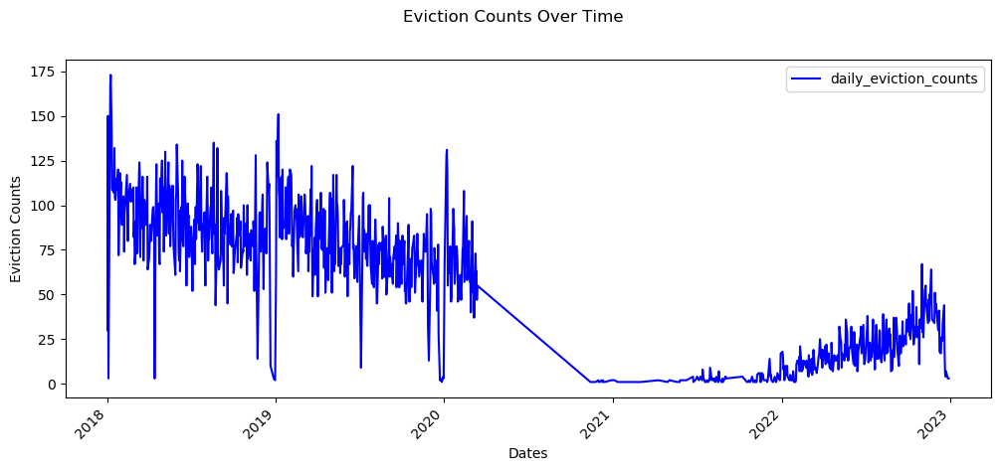

In [63]:
fig02 = plt.gcf()
fig02.set_size_inches(12, 5)

fig02.suptitle("Eviction Counts Over Time")

ax12 = plt.gca()
# ax = plt.gca().set_xticks(df['year'])
ax12.locator_params(integer=True)
#ax12.set_xticks(evi_df01_s16_post["evi_date"].unique())

evi_df01_s16_post.plot(kind="line",
        x="evi_date",
        y='daily_eviction_counts',
        color="blue",
        ax=ax12)

# plt.xticks(range(1995, 2016, 1))
# plt.yticks(range(0,6,1))
plt.xlabel("Dates")
plt.ylabel("Eviction Counts")
plt.xticks(rotation=45)

# fig.savefig('average-rating.png', dpi=300)
plt.show()

#### Barplots for select features

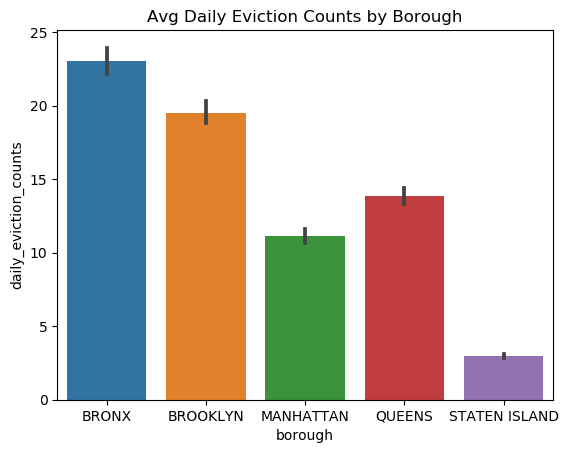

In [64]:
evbar = sns.barplot(x='borough',
                    y='daily_eviction_counts',
                    data=evi_df01_s06_borough).set(title='Avg Daily Eviction Counts by Borough')

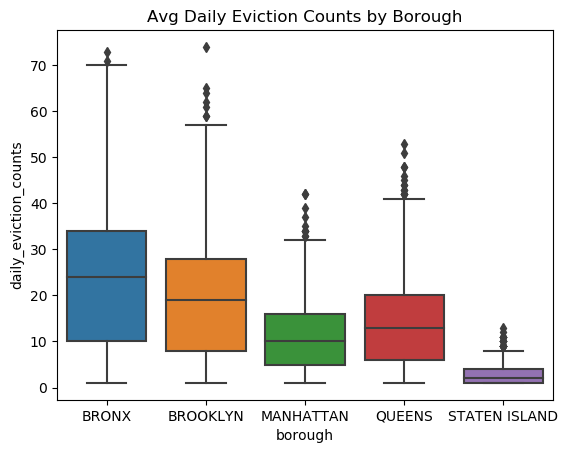

In [65]:
evbar = sns.boxplot(x='borough',
                    y='daily_eviction_counts',
                    data=evi_df01_s06_borough).set(title='Avg Daily Eviction Counts by Borough')

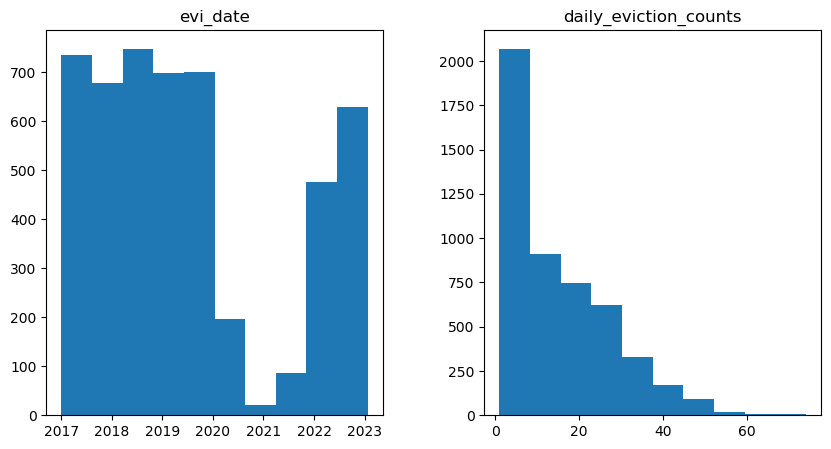

In [66]:
# histograms
evi_df01_s06_borough.hist(grid=False, figsize=(10,5))
plt.show()

#### Summary stats for select features

In [67]:
sum_stat_ev = pd.DataFrame(evi_df01_s06_borough['daily_eviction_counts'].describe()).T
sum_stat_ev

,count,mean,std,min,25%,50%,75%,max
daily_eviction_counts,4966.0,14.596859,12.490213,1.0,4.0,12.0,22.75,74.0


#### Outliers for select features

In [68]:
# Population
IQR_ev = sum_stat_ev['75%'][0] - sum_stat_ev['25%'][0]
low_outlier_ev = sum_stat_ev['25%'][0] - 1.5*(IQR_ev)
high_outlier_ev = sum_stat_ev['75%'][0] + 1.5*(IQR_ev)
print('Low Outlier (daily_eviction_counts):', low_outlier_ev)
print('High Outlier (daily_eviction_counts):', high_outlier_ev)

Low Outlier (daily_eviction_counts): -24.125
High Outlier (daily_eviction_counts): 50.875


In [69]:
# Identify presence of outliers
outliers_ev = evi_df01_s06_borough.loc[(evi_df01_s06_borough['daily_eviction_counts'] < low_outlier) | (evi_df01_s06_borough['daily_eviction_counts'] > high_outlier), 
                            ['borough', 'daily_eviction_counts']]
if outliers_ev.empty:
    print('No outliers found in daily_eviction_counts column')
else:
    print('Outliers found in daily_eviction_counts column ({0}):'.format(len(outliers_ev)))
    print(outliers_ev)

No outliers found in daily_eviction_counts column


#### Determine Skew for select features

In [70]:
# For 'childpoverty' column
daily_eviction_skew = skew(evi_df01_s06_borough['daily_eviction_counts'])
print('Skewness of daily_eviction_counts column:', daily_eviction_skew)

Skewness of daily_eviction_counts column: 0.9837000262831916


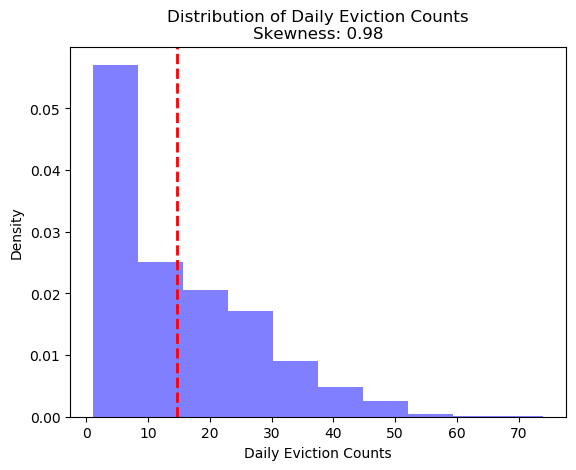

In [71]:
plt.hist(evi_df01_s06_borough['daily_eviction_counts'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of Daily Eviction Counts\nSkewness: {0:.2f}'.format(daily_eviction_skew))
plt.xlabel('Daily Eviction Counts')
plt.ylabel('Density')
plt.axvline(x=evi_df01_s06_borough['daily_eviction_counts'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

### `grad_outcomes`

In [72]:
grd_tsv_tbl_name = 'grad_outcomes'

#### Explore via SQL SELECT statements

In [73]:
# Run query to review a sample of records
grd_total_grads_n01 = "s"

grd_select_borough_stmnt01 = f"""
SELECT * FROM {database_name}.{grd_tsv_tbl_name}
WHERE total_grads_n <> '{grd_total_grads_n01}'
LIMIT 1000
"""

# Display SQL statement
print(grd_select_borough_stmnt01)

# Run SQL statement against Athena table
grd_df01_s01 = pd.read_sql(grd_select_borough_stmnt01,
                           conn)

# Display results
grd_df01_s01.head(11)


SELECT * FROM ads508_t8.grad_outcomes
WHERE total_grads_n <> 's'
LIMIT 1000



,demographic,dbn,school_name,cohort,total_cohort,total_grads_n,total_grads_perc_cohort,total_regents_n,total_regents_perc_cohort,total_regents_perc_grads,...,regents_wo_advanced_n,regents_wo_advanced_perc_cohort,regents_wo_advanced_perc_grads,local_n,local_perc_cohort,local_perc_grads,still_enrolled_n,still_enrolled_perc_cohort,dropped_out_n,dropped_out_perc_cohort
0,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2004,55,37,67.3,17,30.9,45.9,...,17,30.9,45.9,20,36.4,54.1,15,27.3,3,5.5
1,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2005,64,43,67.2,27,42.2,62.8,...,27,42.2,62.8,16,25,37.200000000000003,9,14.1,9,14.1
2,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,...,36,46.2,83.7,7,9,16.3,16,20.5,11,14.1
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006 Aug,78,44,56.4,37,47.4,84.1,...,37,47.4,84.1,7,9,15.9,15,19.2,11,14.1
4,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2001,64,46,71.900000000000006,32,50,69.599999999999994,...,25,39.1,54.3,14,21.9,30.4,10,15.6,6,9.4
5,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2002,52,33,63.5,19,36.5,57.6,...,11,21.2,33.299999999999997,14,26.9,42.4,16,30.8,1,1.9
6,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2003,87,67,77,39,44.8,58.2,...,28,32.200000000000003,41.8,28,32.200000000000003,41.8,9,10.3,11,12.6
7,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2004,112,75,67,36,32.1,48,...,30,26.8,40,39,34.799999999999997,52,33,29.5,4,3.6
8,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2005,121,64,52.9,35,28.9,54.7,...,31,25.6,48.4,29,24,45.3,41,33.9,11,9.1
9,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2006,124,53,42.7,42,33.9,79.2,...,34,27.4,64.2,11,8.9,20.8,46,37.1,20,16.100000000000001


#### Perform aggregated summaries

In [74]:
# Run query to review a sample of records
grd_select_hispanic_stmnt01 = f"""
SELECT DISTINCT
    demographic,
    COUNT(*)
FROM {database_name}.{grd_tsv_tbl_name}
GROUP BY demographic
LIMIT 100
"""

# Display SQL statement
print(grd_select_hispanic_stmnt01)

# Run SQL statement against Athena table
grd_df01_s02 = pd.read_sql(grd_select_hispanic_stmnt01,
                           conn)

# Display results
grd_df01_s02.head(11)


SELECT DISTINCT
    demographic,
    COUNT(*)
FROM ads508_t8.grad_outcomes
GROUP BY demographic
LIMIT 100



,demographic,_col1
0,English Language Learners,2036
1,Special Education Students,2471
2,Black,2403
3,General Education Students,2471
4,Hispanic,2385
5,English Proficient Students,2471
6,Total Cohort,2493
7,Male,2412
8,Asian,1780
9,White,1777


#### Load potential predictors and target for further exploration using pandas

In [75]:
grd_box_stmnt01 = f"""
SELECT
    demographic,
    dbn,
    cohort,
    CAST(total_cohort AS DOUBLE) AS total_cohort,
    CAST(total_grads_n AS DOUBLE) AS total_grads_n,
    CAST(total_regents_n AS DOUBLE) AS total_regents_n,
    CAST(advanced_regents_n AS DOUBLE) AS advanced_regents_n,
    CAST(regents_wo_advanced_n AS DOUBLE) AS regents_wo_advanced_n,
    CAST(local_n AS DOUBLE) AS local_n,
    CAST(still_enrolled_n AS DOUBLE) AS still_enrolled_n,
    CAST(dropped_out_n AS DOUBLE) AS dropped_out_n
FROM {database_name}.{grd_tsv_tbl_name}
WHERE total_grads_n <> '{grd_total_grads_n01}'
LIMIT 50000
"""

# Display SQL statement
print(grd_box_stmnt01)

# Run SQL statement against Athena table
grd_df01_s05 = pd.read_sql(grd_box_stmnt01,
                           conn)

# Display results
grd_df01_s05.head(11)


SELECT
    demographic,
    dbn,
    cohort,
    CAST(total_cohort AS DOUBLE) AS total_cohort,
    CAST(total_grads_n AS DOUBLE) AS total_grads_n,
    CAST(total_regents_n AS DOUBLE) AS total_regents_n,
    CAST(advanced_regents_n AS DOUBLE) AS advanced_regents_n,
    CAST(regents_wo_advanced_n AS DOUBLE) AS regents_wo_advanced_n,
    CAST(local_n AS DOUBLE) AS local_n,
    CAST(still_enrolled_n AS DOUBLE) AS still_enrolled_n,
    CAST(dropped_out_n AS DOUBLE) AS dropped_out_n
FROM ads508_t8.grad_outcomes
WHERE total_grads_n <> 's'
LIMIT 50000



,demographic,dbn,cohort,total_cohort,total_grads_n,total_regents_n,advanced_regents_n,regents_wo_advanced_n,local_n,still_enrolled_n,dropped_out_n
0,Special Education Students,13K605,2004,48.0,5.0,1.0,0.0,1.0,4.0,11.0,3.0
1,Special Education Students,13K605,2006 Aug,45.0,3.0,0.0,0.0,0.0,3.0,13.0,8.0
2,Special Education Students,14K071,2006,21.0,3.0,1.0,0.0,1.0,2.0,9.0,7.0
3,Special Education Students,14K071,2006 Aug,21.0,4.0,1.0,0.0,1.0,3.0,8.0,7.0
4,General Education Students,07X379,2006 Aug,45.0,8.0,0.0,0.0,0.0,8.0,30.0,7.0
5,Special Education Students,14K474,2001,25.0,9.0,0.0,0.0,0.0,9.0,7.0,5.0
6,Special Education Students,14K474,2002,21.0,4.0,0.0,0.0,0.0,4.0,7.0,5.0
7,Special Education Students,14K474,2004,35.0,8.0,2.0,0.0,2.0,6.0,19.0,4.0
8,Special Education Students,14K477,2003,27.0,8.0,1.0,0.0,1.0,7.0,14.0,5.0
9,Special Education Students,14K477,2004,32.0,10.0,1.0,0.0,1.0,9.0,8.0,12.0


#### Display barplots for select features

[Text(0.5, 1.0, 'Total Cohorts by Cohort Year')]

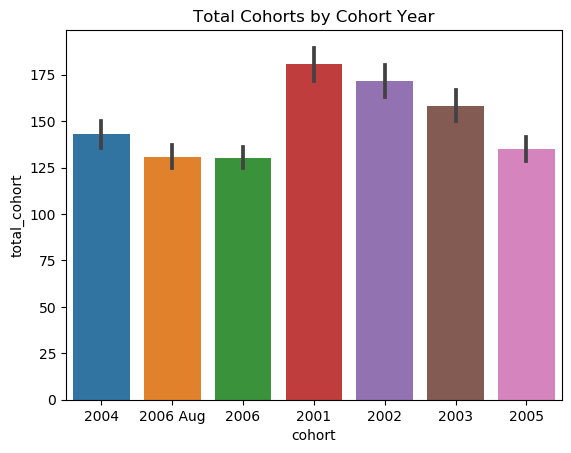

In [76]:
sns.barplot(x='cohort',
            y='total_cohort',
            data=grd_df01_s05).set(title='Total Cohorts by Cohort Year')

[Text(0.5, 1.0, 'Total Grads by Cohort Year')]

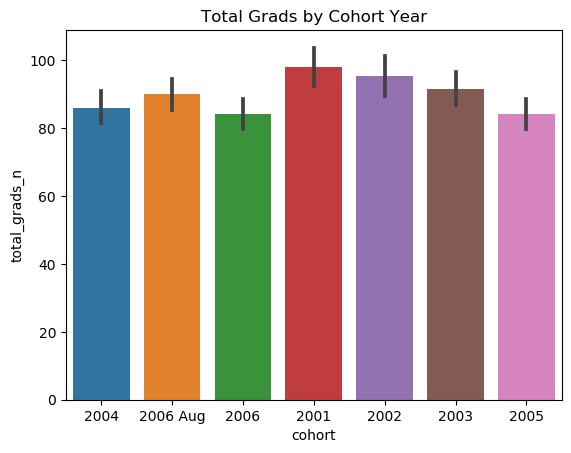

In [77]:
sns.barplot(x='cohort',
            y='total_grads_n',
            data=grd_df01_s05).set(title='Total Grads by Cohort Year')

[Text(0.5, 1.0, 'Total Dropped Out by Cohort Year')]

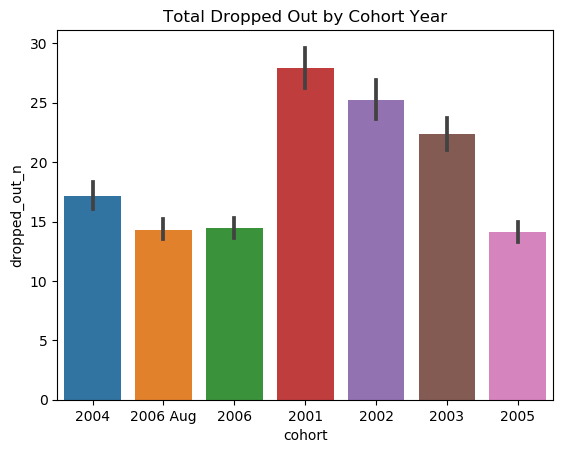

In [78]:
sns.barplot(x='cohort',
            y='dropped_out_n',
            data=grd_df01_s05).set(title='Total Dropped Out by Cohort Year')

#### Display boxplots for select features

[Text(0.5, 1.0, 'Total Cohorts by Cohort Year')]

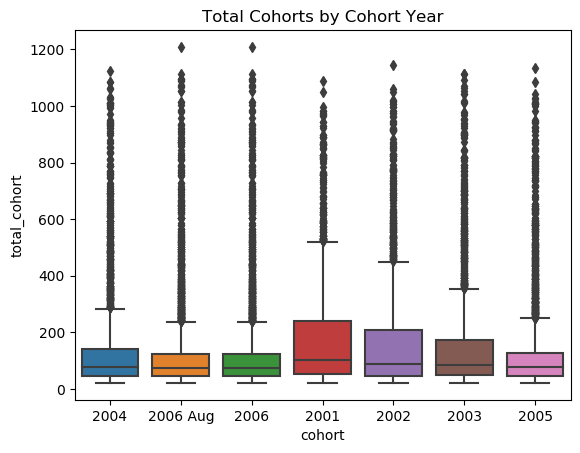

In [79]:
sns.boxplot(x='cohort',
            y='total_cohort',
            data=grd_df01_s05).set(title='Total Cohorts by Cohort Year')

[Text(0.5, 1.0, 'Total Grads by Cohort Year')]

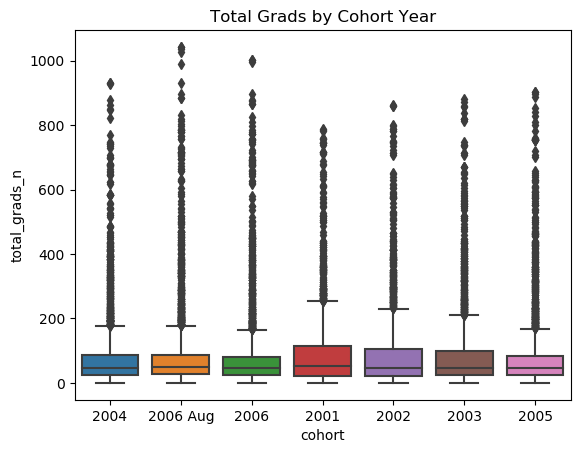

In [80]:
sns.boxplot(x='cohort',
            y='total_grads_n',
            data=grd_df01_s05).set(title='Total Grads by Cohort Year')

[Text(0.5, 1.0, 'Total Dropped Out by Cohort Year')]

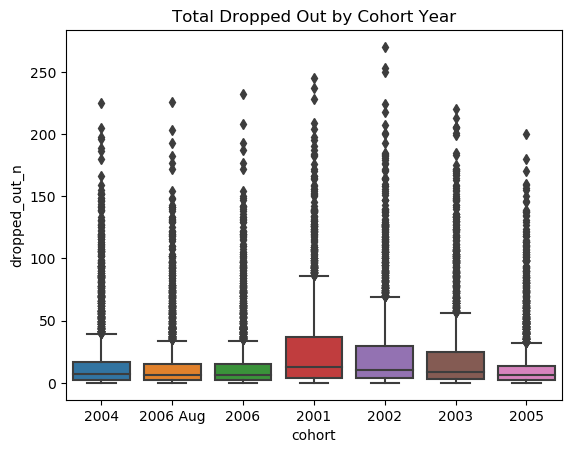

In [81]:
sns.boxplot(x='cohort',
            y='dropped_out_n',
            data=grd_df01_s05).set(title='Total Dropped Out by Cohort Year')

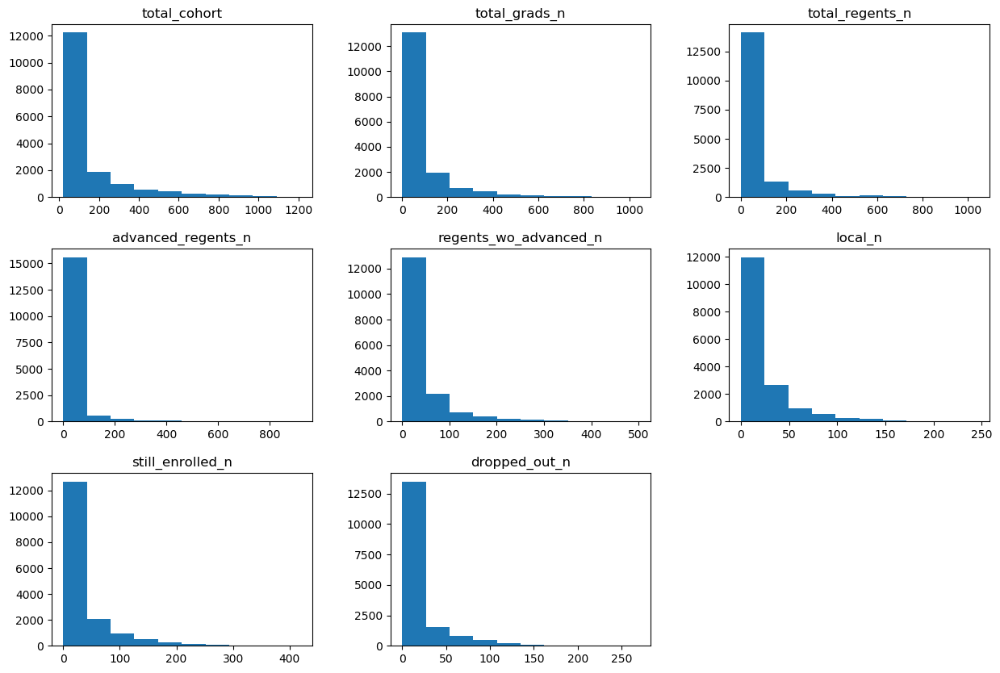

In [82]:
# histograms
grd_df01_s05.hist(grid=False, figsize=(15,10))
plt.show()

#### Create subsets of columns for various purposes

In [83]:
grd_df01_s05_num_lst01 = ['total_cohort',
                          'total_grads_n',
                          'total_regents_n',
                          'advanced_regents_n',
                          'regents_wo_advanced_n',
                          'local_n',
                          'still_enrolled_n',
                          'dropped_out_n'
                         ]

grd_df01_s05_num_lst02 = ['total_cohort',
                          'total_grads_n',
                          'total_regents_n',
                          'advanced_regents_n',
                          'regents_wo_advanced_n',
                          'local_n',
                          'still_enrolled_n',
                          'dropped_out_n'
                         ]

grd_df02_s01 = grd_df01_s05[grd_df01_s05_num_lst01]
grd_df03_s01 = grd_df01_s05[grd_df01_s05_num_lst02]

display(grd_df02_s01.head(5))

,total_cohort,total_grads_n,total_regents_n,advanced_regents_n,regents_wo_advanced_n,local_n,still_enrolled_n,dropped_out_n
0,48.0,5.0,1.0,0.0,1.0,4.0,11.0,3.0
1,45.0,3.0,0.0,0.0,0.0,3.0,13.0,8.0
2,21.0,3.0,1.0,0.0,1.0,2.0,9.0,7.0
3,21.0,4.0,1.0,0.0,1.0,3.0,8.0,7.0
4,45.0,8.0,0.0,0.0,0.0,8.0,30.0,7.0


#### Scatterplots of numerical features

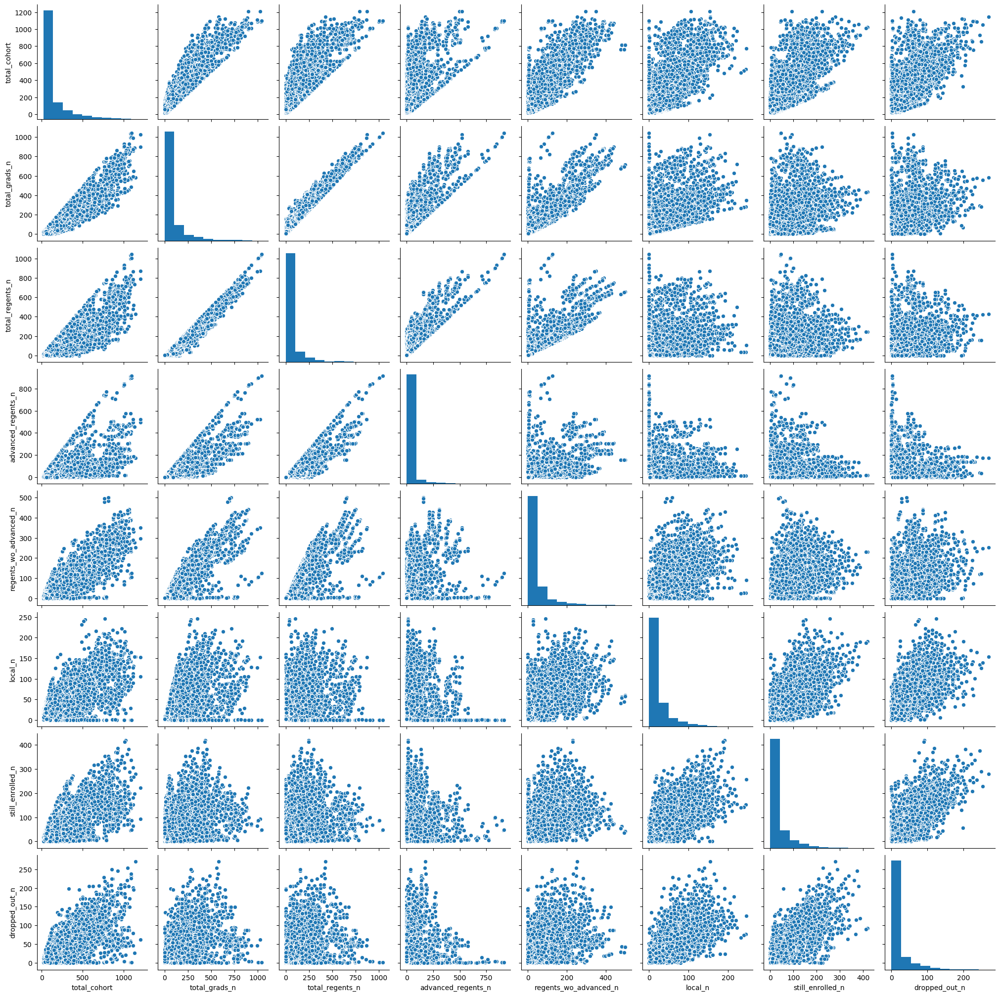

In [84]:
# Pair scatter plots for selected features
sns.pairplot(grd_df03_s01)

#### Summary stats for select features

In [85]:
sum_stat_totcohort = pd.DataFrame(grd_df01_s05['total_cohort'].describe()).T
sum_stat_totgrad = pd.DataFrame(grd_df01_s05['total_grads_n'].describe()).T
sum_stat_totdrop = pd.DataFrame(grd_df01_s05['dropped_out_n'].describe()).T
sum_stat_grad = pd.concat([sum_stat_totcohort, sum_stat_totgrad, sum_stat_totdrop])
sum_stat_grad

,count,mean,std,min,25%,50%,75%,max
total_cohort,16704.0,146.681454,179.345146,21.0,47.0,79.0,151.0,1209.0
total_grads_n,16704.0,89.159662,123.704706,0.0,25.0,48.0,93.0,1043.0
dropped_out_n,16704.0,18.447079,29.130904,0.0,3.0,7.0,19.0,270.0


#### Outliers for select features

In [86]:
# Total Cohort
IQR_totcohort = sum_stat_totcohort['75%'][0] - sum_stat_totcohort['25%'][0]
low_outlier_totcohort = sum_stat_totcohort['25%'][0] - 1.5*(IQR_totcohort)
high_outlier_totcohort = sum_stat_totcohort['75%'][0] + 1.5*(IQR_totcohort)
print('Low Outlier (total_cohort):', low_outlier_totcohort)
print('High Outlier (total_cohort):', high_outlier_totcohort)

# Total Grads
IQR_totgrad = sum_stat_totgrad['75%'][0] - sum_stat_totgrad['25%'][0]
low_outlier_totgrad = sum_stat_totgrad['25%'][0] - 1.5*(IQR_totgrad)
high_outlier_totgrad = sum_stat_totgrad['75%'][0] + 1.5*(IQR_totgrad)
print('Low Outlier (total_grads_n):', low_outlier_totgrad)
print('High Outlier (total_grads_n):', high_outlier_totgrad)

# Total Dropouts
IQR_totdrop = sum_stat_totdrop['75%'][0] - sum_stat_totdrop['25%'][0]
low_outlier_totdrop = sum_stat_totdrop['25%'][0] - 1.5*(IQR_totdrop)
high_outlier_totdrop = sum_stat_totdrop['75%'][0] + 1.5*(IQR_totdrop)
print('Low Outlier (dropped_out_n):', low_outlier_totdrop)
print('High Outlier (dropped_out_n):', high_outlier_totdrop)

Low Outlier (total_cohort): -109.0
High Outlier (total_cohort): 307.0
Low Outlier (total_grads_n): -77.0
High Outlier (total_grads_n): 195.0
Low Outlier (dropped_out_n): -21.0
High Outlier (dropped_out_n): 43.0


In [87]:
# Identify presence of outliers
outliers_totcohort = grd_df01_s05.loc[(grd_df01_s05['total_cohort'] < low_outlier_totcohort) | (grd_df01_s05['total_cohort'] > high_outlier_totcohort), 
                            ['dbn', 'total_cohort']]
if outliers_totcohort.empty:
    print('No outliers found in total_cohort column')
else:
    print('Outliers found in total_cohort column ({0}):'.format(len(outliers_totcohort)))
    print(outliers_totcohort)
    
outliers_totgrad = grd_df01_s05.loc[(grd_df01_s05['total_grads_n'] < low_outlier_totgrad) | (grd_df01_s05['total_grads_n'] > high_outlier_totgrad), 
                            ['dbn', 'total_grads_n']]
if outliers_totgrad.empty:
    print('No outliers found in total_grads_n column')
else:
    print('Outliers found in total_grads_n column ({0}):'.format(len(outliers_totgrad)))
    print(outliers_totgrad)
    
outliers_totdrop = grd_df01_s05.loc[(grd_df01_s05['dropped_out_n'] < low_outlier_totdrop) | (grd_df01_s05['dropped_out_n'] > high_outlier_totdrop), 
                            ['dbn', 'dropped_out_n']]
if outliers_totdrop.empty:
    print('No outliers found in dropped_out_n column')
else:
    print('Outliers found in dropped_out_n column ({0}):'.format(len(outliers_totdrop)))
    print(outliers_totdrop)

Outliers found in total_cohort column (2095):
          dbn  total_cohort
349    02M400         360.0
350    02M400         372.0
351    02M400         312.0
353    02M400         344.0
354    02M400         352.0
...       ...           ...
16644  31R460         364.0
16645  31R460         353.0
16646  31R460         458.0
16647  31R460         470.0
16648  31R460         470.0

[2095 rows x 2 columns]
Outliers found in total_grads_n column (1852):
          dbn  total_grads_n
349    02M400          271.0
350    02M400          276.0
351    02M400          228.0
352    02M400          236.0
353    02M400          241.0
...       ...            ...
16644  31R460          247.0
16645  31R460          227.0
16646  31R460          298.0
16647  31R460          328.0
16648  31R460          341.0

[1852 rows x 2 columns]
Outliers found in dropped_out_n column (2111):
          dbn  dropped_out_n
38     16K455           47.0
120    20K490           44.0
124    20K505           45.0
452    02M

#### Determine Skew for select features

In [88]:
# For 'total_cohort' column
totcohort_skew = skew(grd_df01_s05['total_cohort'])
print('Skewness of total_cohort column:', totcohort_skew)

# For 'total_grad' column
totgrad_skew = skew(grd_df01_s05['total_grads_n'])
print('Skewness of total_grads_n column:', totgrad_skew)

# For 'dropped_out_n' column
totdrop_skew = skew(grd_df01_s05['dropped_out_n'])
print('Skewness of dropped_out_n column:', totgrad_skew)

Skewness of total_cohort column: 2.6085451220516616
Skewness of total_grads_n column: 3.2689210059148963
Skewness of dropped_out_n column: 3.2689210059148963


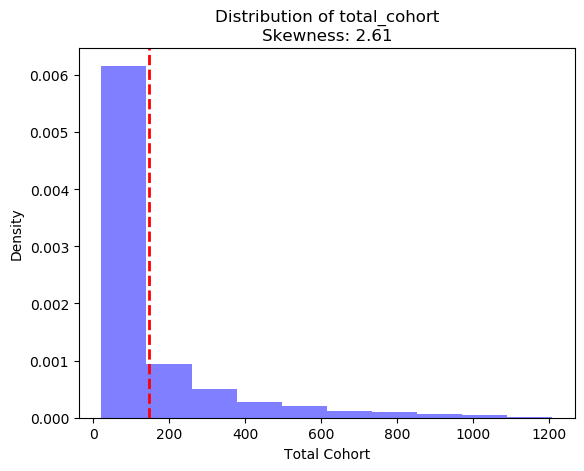

In [89]:
plt.hist(grd_df01_s05['total_cohort'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of total_cohort\nSkewness: {0:.2f}'.format(totcohort_skew))
plt.xlabel('Total Cohort')
plt.ylabel('Density')
plt.axvline(x=grd_df01_s05['total_cohort'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

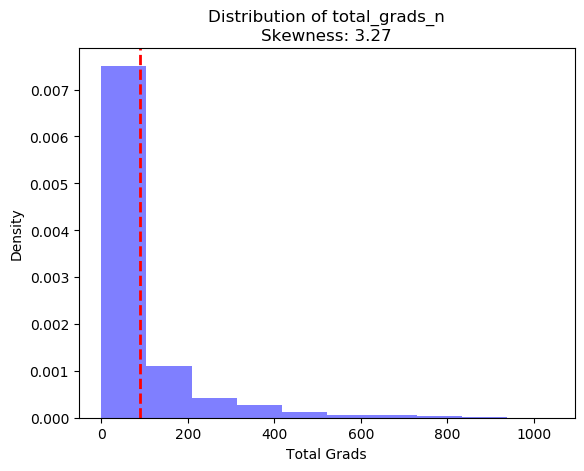

In [90]:
plt.hist(grd_df01_s05['total_grads_n'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of total_grads_n\nSkewness: {0:.2f}'.format(totgrad_skew))
plt.xlabel('Total Grads')
plt.ylabel('Density')
plt.axvline(x=grd_df01_s05['total_grads_n'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

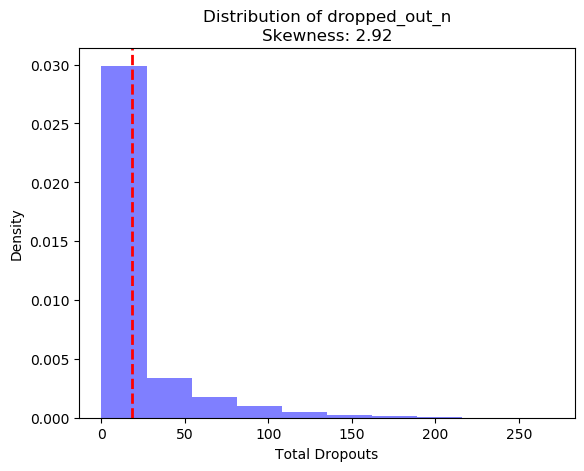

In [91]:
plt.hist(grd_df01_s05['dropped_out_n'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of dropped_out_n\nSkewness: {0:.2f}'.format(totdrop_skew))
plt.xlabel('Total Dropouts')
plt.ylabel('Density')
plt.axvline(x=grd_df01_s05['dropped_out_n'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

#### Examine features with missing values

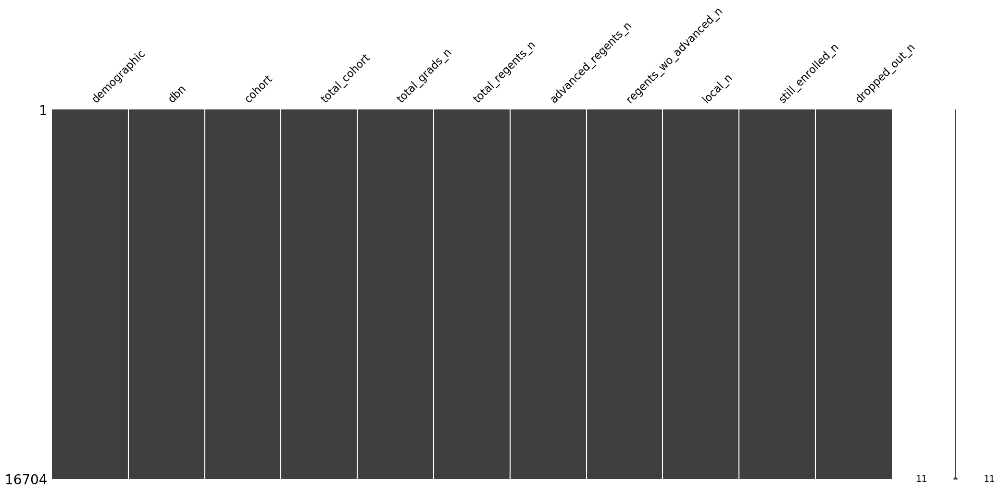

In [92]:
# Visualize missing values in each column
msno.matrix(grd_df01_s05)

In [93]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (5% of total N)
grd_df01_s05_null_summ01 = pd.DataFrame(grd_df01_s05.isnull().sum(),
                                        columns=['null_count'])

grd_df01_s05_null_summ02 = grd_df01_s05_null_summ01.loc[(grd_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
grd_df01_s05_null_summ03 = grd_df01_s05_null_summ02.reset_index()
print(grd_df01_s05_null_summ03)

grd_df01_s05_null_summ04 = grd_df01_s05_null_summ03.loc[grd_df01_s05_null_summ03['null_count'] > (len(grd_df01_s05)*.05)]
print('\n', grd_df01_s05_null_summ04)

grd_df01_s05_null_summ04_remove_lst01 = list(grd_df01_s05_null_summ04['index'])
print('\n', grd_df01_s05_null_summ04_remove_lst01)

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Examine features with near zero variances

In [94]:
# Review near-zero variance (NZV) features for possible removal
grd_df02_s01_nzv_fit = VarianceThreshold().fit(grd_df02_s01)
grd_df02_s01_nzv_vc01 = grd_df02_s01_nzv_fit.transform(grd_df02_s01)

# Get the names of the selected features
grd_df02_s01_nzv_fit_select_features = grd_df02_s01.columns[grd_df02_s01_nzv_fit.get_support()]

grd_df02_s01_nzv_df01 = pd.DataFrame(grd_df02_s01_nzv_vc01,
                                     columns=grd_df02_s01_nzv_fit_select_features)

display(grd_df02_s01_nzv_df01.head(5))
print(f'NZV transformed matrix dimensions = {grd_df02_s01_nzv_df01.shape}')

print(f'\n{grd_df02_s01.shape[1] - grd_df02_s01_nzv_df01.shape[1]} near zero variance features were eliminated')

,total_cohort,total_grads_n,total_regents_n,advanced_regents_n,regents_wo_advanced_n,local_n,still_enrolled_n,dropped_out_n
0,48.0,5.0,1.0,0.0,1.0,4.0,11.0,3.0
1,45.0,3.0,0.0,0.0,0.0,3.0,13.0,8.0
2,21.0,3.0,1.0,0.0,1.0,2.0,9.0,7.0
3,21.0,4.0,1.0,0.0,1.0,3.0,8.0,7.0
4,45.0,8.0,0.0,0.0,0.0,8.0,30.0,7.0


NZV transformed matrix dimensions = (16704, 8)

0 near zero variance features were eliminated


#### Correlations

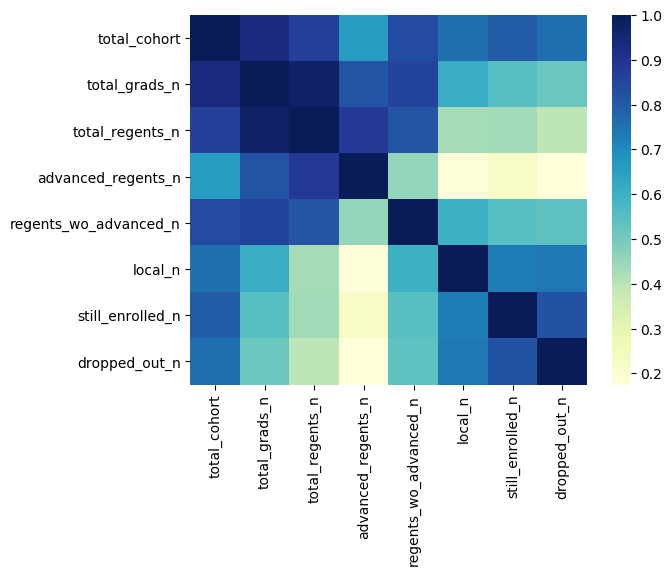

In [95]:
# Calculate correlation matrix
grad_corr_matrix = grd_df01_s05.corr()

# Generate heatmap plot
sns.heatmap(grad_corr_matrix, cmap="YlGnBu")

### `jobs`

In [96]:
job_tsv_tbl_name = 'jobs'

#### Explore via SQL SELECT statements

In [97]:
# Run query to review a sample of records
job_agency01 = "housing"

job_select_borough_stmnt01 = f"""
SELECT * FROM {database_name}.{job_tsv_tbl_name}
WHERE LOWER(agency) LIKE '%{job_agency01}%'
LIMIT 100
"""

# Display SQL statement
print(job_select_borough_stmnt01)

# Run SQL statement against Athena table
job_df01_s01 = pd.read_sql(job_select_borough_stmnt01,
                           conn)

# Display results
job_df01_s01.head(11)


SELECT * FROM ads508_t8.jobs
WHERE LOWER(agency) LIKE '%housing%'
LIMIT 100



,job_id,agency,posting_type,num_of_positions,business_title,civil_service_title,title_classification,title_code_no,level,job_category,...,additional_information,to_apply,hours_or_shift,work_location_1,recruitment_contact,residency_requirement,posting_date,post_until,posting_updated,process_date
0,573469,HOUSING PRESERVATION & DVLPMNT,External,1,Strategic Program Development Analyst for the ...,CITY RESEARCH SCIENTIST,Non-Competitive-5,21744,02,"Policy, Research & Analysis",...,We engage New Yorkers to build and sustain nei...,Continue to work on the implementation of Loca...,Retrieve and review affordable housing regulat...,Research initiatives in other jurisdictions or...,Understand and leverage existing Agency datase...,Summarizing and communicating findingsâquali...,Contributing to the rollout of new initiatives...,"Conducting special research, analytical, or co...",Adhering to work plans and internal and extern...,"Participating in meetings, presentations, and ..."
1,568091,HOUSING PRESERVATION & DVLPMNT,External,5,Case Manager for the Division of Tenant Resources,COMMUNITY ASSOCIATE,Non-Competitive-5,56057,00,Constituent Services & Community Programs,...,Determination and verification of eligibility â¢,Client briefings {internal and external meetin...,May perform community outreach to assist Secti...,"Prepare and send appropriate correspondence, t...","Document case files and electronic records, fi...",Rent calculations â¢,Review of yearly recertificationâs of househ...,Demonstrate ability to manage multiple cases w...,"Attend mandatory trainings""",Qualification Requirements 1. High school gra...
2,576376,NYC HOUSING AUTHORITY,Internal,1,CARETAKER X,CARETAKER (HA),Labor-3,90645,00,Building Operations & Maintenance,...,Prepare apartments for move outs. Please rea...,Qualification Requirements There are no forma...,,"""1.",Possession of a valid driver's license is requ...,Preference will be given to employees who have...,"NYCHA residents are encouraged to apply.""",Click the Apply now button.,,
3,571769,HOUSING PRESERVATION & DVLPMNT,Internal,2,Case Manager for the Division of Tenant Resources,COMMUNITY ASSOCIATE,Non-Competitive-5,56057,00,Constituent Services & Community Programs,...,Determination and verification of eligibility â¢,Client briefings {internal and external meetin...,May perform community outreach to assist Secti...,"Prepare and send appropriate correspondence, t...","Document case files and electronic records, fi...",Rent calculations â¢,Review of yearly recertificationâs of househ...,Demonstrate ability to manage multiple cases w...,"Attend mandatory trainings""",Qualification Requirements 1. High school gra...
4,575854,HOUSING PRESERVATION & DVLPMNT,External,1,"Data & Analytics Manager, Division of Strategi...",CITY RESEARCH SCIENTIST,Non-Competitive-5,21744,02,"Policy, Research & Analysis",...,We engage New Yorkers to build and sustain nei...,"Gather, prepare, and merge large datasets from...",Create performance metrics for lottery and hom...,Manage and analyze eviction filing data to und...,Prepare analytic reports to inform program des...,Support the implementation of data-driven prog...,Develop strategies for data integration and au...,Assist SOA colleagues with quantitative analys...,"Respond to ad hoc data requests from programs,...","1. For Assignment Level I (only physical, bio..."
5,554300,NYC HOUSING AUTHORITY,External,1,RESIDENT RELOCATION SERVICES COMMUNITY COORDIN...,COMMUNITY COORDINATOR,Non-Competitive-5,56058,00,Constituent Services & Community Programs,...,"""1.",Preference will be given to employees who have...,"NYCHA residents are encouraged to apply.""",Click the Apply Now button.,,,,NYCHA has no residency requirements.,10/28/2022,
6,575870,HOUSING PRESERVATION & DVLPMNT,Internal,1,Director of Manhattan Planning for the Divisio...,CITY PLANNER,Competitive-1,22122,03,"Engineering, Architecture, & Planning",...,We engage New Yorkers to build and sustain nei...,Planning & Predev

#### Perform aggregated summaries

In [98]:
# Run query to review a sample of records
job_select_job_category_stmnt01 = f"""
SELECT DISTINCT
    job_category,
    COUNT(*)
FROM {database_name}.{job_tsv_tbl_name}
WHERE job_category IS NULL
GROUP BY job_category
LIMIT 100
"""

# Display SQL statement
print(job_select_job_category_stmnt01)

# Run SQL statement against Athena table
job_df01_s02 = pd.read_sql(job_select_job_category_stmnt01,
                           conn)

# Display results
print(job_df01_s02.shape)
display(job_df01_s02.head(11))


SELECT DISTINCT
    job_category,
    COUNT(*)
FROM ads508_t8.jobs
WHERE job_category IS NULL
GROUP BY job_category
LIMIT 100

(0, 2)


,job_category,_col1


In [99]:
job_summ_borough_stmnt01 = f"""
SELECT
    job_id,
    COUNT(*) AS jobs_count
FROM {database_name}.{job_tsv_tbl_name}
GROUP BY job_id
LIMIT 100
"""

# Display SQL statement
print(job_summ_borough_stmnt01)

# Run SQL statement against Athena table
job_df01_s03 = pd.read_sql(job_summ_borough_stmnt01,
                           conn)

# Display results
job_df01_s03.head(11)


SELECT
    job_id,
    COUNT(*) AS jobs_count
FROM ads508_t8.jobs
GROUP BY job_id
LIMIT 100



,job_id,jobs_count
0,542286,2
1,552250,2
2,568091,2
3,554300,2
4,558052,2
5,574709,2
6,570722,2
7,558013,2
8,548134,2
9,542301,2


In [100]:
job_summ_salary_range_from01 = f"""
SELECT
    job_id,
    job_category,
    salary_range_from,
    salary_range_to
FROM {database_name}.{job_tsv_tbl_name}
WHERE salary_range_from LIKE '%anager%'
LIMIT 10000
"""

# Display SQL statement
print(job_summ_salary_range_from01)

# Run SQL statement against Athena table
job_df01_s04 = pd.read_sql(job_summ_salary_range_from01,
                           conn)

# Display results
job_df01_s04.head(100)


SELECT
    job_id,
    job_category,
    salary_range_from,
    salary_range_to
FROM ads508_t8.jobs
WHERE salary_range_from LIKE '%anager%'
LIMIT 10000



,job_id,job_category,salary_range_from,salary_range_to
0,561954,00,Manager,40000
1,540477,00,Experienced (non-manager),80440
2,540190,00,Experienced (non-manager),80440
3,561954,00,Manager,40000
4,566429,02,Experienced (non-manager),50972
5,566429,02,Experienced (non-manager),50972
6,540190,00,Experienced (non-manager),80440
7,540477,00,Experienced (non-manager),80440


#### Load potential predictors and target for further exploration using pandas

In [101]:
job_box_stmnt01 = f"""
SELECT
    agency,
    posting_type,
    num_of_positions,
    business_title,
    civil_service_title,
    title_classification,
    title_code_no,
    level,
    job_category,
    fulltime_or_parttime_indicator,
    career_level,
    CAST(salary_range_from AS DOUBLE) AS salary_range_from,
    CAST(salary_range_to AS DOUBLE) AS salary_range_to,
    salary_frequency,
    work_location,
    division_or_work_unit,
    job_description,
    minimum_qual_requirements,
    preferred_skills,
    additional_information,
    to_apply,
    hours_or_shift,
    work_location_1,
    recruitment_contact,
    residency_requirement,
    posting_date,
    post_until,
    posting_updated,
    process_date
FROM {database_name}.{job_tsv_tbl_name}
WHERE salary_range_from NOT LIKE '%anager%'
LIMIT 5000
"""

# Display SQL statement
print(job_box_stmnt01)

# Run SQL statement against Athena table
job_df01_s05 = pd.read_sql(job_box_stmnt01,
                           conn)

# Display results
job_df01_s05.head(11)


SELECT
    agency,
    posting_type,
    num_of_positions,
    business_title,
    civil_service_title,
    title_classification,
    title_code_no,
    level,
    job_category,
    fulltime_or_parttime_indicator,
    career_level,
    CAST(salary_range_from AS DOUBLE) AS salary_range_from,
    CAST(salary_range_to AS DOUBLE) AS salary_range_to,
    salary_frequency,
    work_location,
    division_or_work_unit,
    job_description,
    minimum_qual_requirements,
    preferred_skills,
    additional_information,
    to_apply,
    hours_or_shift,
    work_location_1,
    recruitment_contact,
    residency_requirement,
    posting_date,
    post_until,
    posting_updated,
    process_date
FROM ads508_t8.jobs
WHERE salary_range_from NOT LIKE '%anager%'
LIMIT 5000



,agency,posting_type,num_of_positions,business_title,civil_service_title,title_classification,title_code_no,level,job_category,fulltime_or_parttime_indicator,...,additional_information,to_apply,hours_or_shift,work_location_1,recruitment_contact,residency_requirement,posting_date,post_until,posting_updated,process_date
0,CONSUMER AND WORKER PROTECTION,External,1,Inspector,INSPECTOR (CONSUMER AND WORKER,Competitive-1,33997,01,"Public Safety, Inspections, & Enforcement",F,...,Inspecting and investigating trade practices t...,"Lifting weights, walking, using mass transit, ...","Completing reports on complaints investigated,...",Preparing summonses and testifying at hearings...,Utilizing computer systems for email correspon...,Communicating clearly and concisely both writt...,Administrative duties such as copying and scan...,Maintaining a professional demeanor with excel...,"Performing other related work.""",1. A four-year high school diploma or its educ...
1,DEPT OF DESIGN & CONSTRUCTION,External,1,Silver Stars - Application Development Advisor,COMPUTER PROGRAMMER ANALYST,Competitive-1,13651,01,"Technology, Data & Innovation",P,...,,"For City Employees, please go to Employee Self...",20 Hours,30-30 Thomson Ave LIC NY 11101,,New York City residency is not required for th...,02/15/2023,16-APR-2023,02/16/2023,03/07/2023
2,NYC HOUSING AUTHORITY,External,1,Project Manager,ADMINISTRATIVE PROJECT MANAGER,Competitive-1,83008,M2,"Engineering, Architecture, & Planning",F,...,1. INTERAGENCY TRANSFERS INTO NYCHA OF THOSE ...,Click the Apply Now button.,,,,NYCHA has no residency requirements.,01/31/2023,,01/31/2023,03/07/2023
3,DEPARTMENT OF TRANSPORTATION,Internal,1,ASSISTANT COMMISSIONER/DEPUTY CHIEF ENGINEER,ADMINISTRATIVE ENGINEER,Competitive-1,10015,M4,"Engineering, Architecture, & Planning",F,...,The City of New York is an inclusive equal opp...,Resumes may be submitted electronically using ...,35 HOURS,55 Water St Ny Ny,,New York City Residency is not required for th...,07/16/2022,,07/18/2022,03/07/2023
4,LANDMARKS PRESERVATION COMM,Internal,1,Custom Application Development Associate,COMPUTER SPECIALIST (SOFTWARE),Competitive-1,13632,02,"Technology, Data & Innovation",F,...,"Designing, developing, implementing, troublesh...",Supporting CIO on agencyâs cybersecurity rea...,Providing technical support for the agencyâs...,"Executing daily, weekly, and monthly data load...",Creating business process improvements and str...,Compiling and validating data; reinforcing and...,Writing detailed technical documentation â¢,Working with business process stakeholders on ...,Conducting business process analysis and softw...,Working with routine tasks as well as more ext...
5,DEPT OF ENVIRONMENT PROTECTION,External,1,Operations Coordinator,PARK SUPERVISOR,Competitive-1,81111,02,Constituent Services & Community Programs Buil...,F,...,Coordinates fleet operations and fleet managem...,Provides facilities management support. Coordi...,"Provides operational support for field units, ...",May administer pilot programs that require clo...,Monitors storehouse operations generating curr...,Supports and facilitates coordination between ...,1. A baccalaureate degree from an accredited c...,"""The ideal candidate will have excellent commu...",Excellent written and oral communications skil...,Strong computer skills including knowledge of ...
6,DEPT OF DESIGN & CONSTRUCTION,Internal,1,Environmental Project Manager,ASSISTANT ENVIRONMENTAL ENGINE,Competitive-1,20617,00,"Engineering, Architecture, & Planning",F,...,,"For City Employees, please go to Employee Self...",35 Hours,"30-30 Thomson Avenue, Long Island City, NY 11101",,New York City Residency is not required for th...,01/09/2023,10-MAR-2023,01/24/2023,03/07/2023
7,LAW DEPARTMENT,Internal,2,"Assistant Corporation Counsel, Labor and Emplo...",ASSISTANT CORPORATION COUNSEL,Exempt-4,30112,00,Legal Affairs,F,...,,Please click on the Apply Now button. Please u...,,,,New York City Residency is not required for th.

#### Display boxplots for select features

[Text(0.5, 1.0, 'Range Floor by Job Category')]

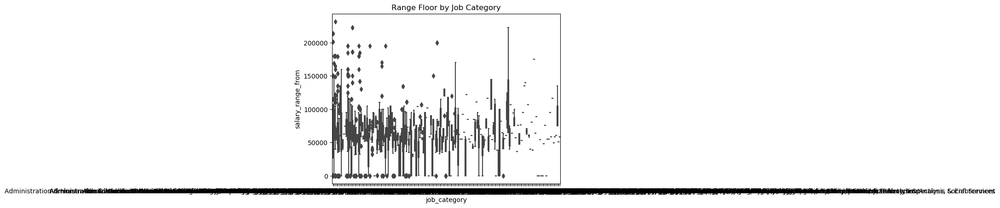

In [102]:
sns.boxplot(x='job_category',
            y='salary_range_from',
            data=job_df01_s05).set(title='Range Floor by Job Category')

[Text(0.5, 1.0, 'Range Ceiling by Job Category')]

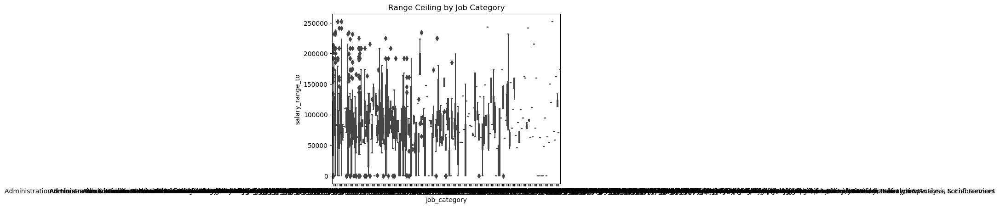

In [103]:
sns.boxplot(x='job_category',
            y='salary_range_to',
            data=job_df01_s05).set(title='Range Ceiling by Job Category')

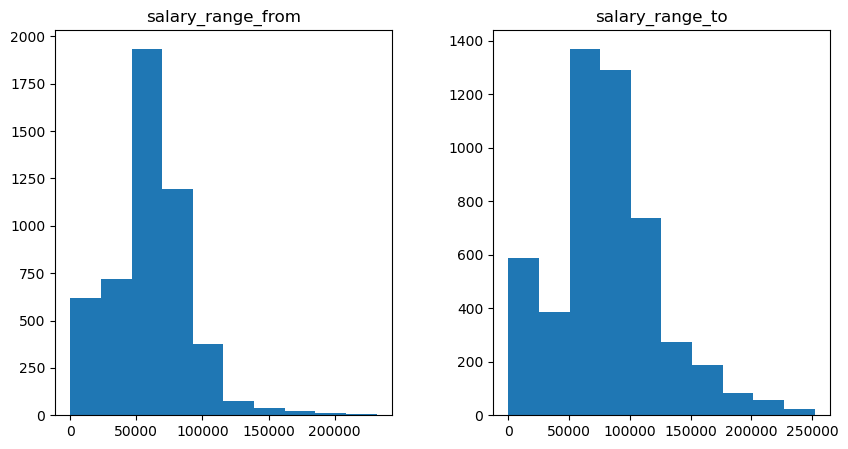

In [104]:
# histograms
job_df01_s05.hist(grid=False, figsize=(10,5))
plt.show()

#### Create subsets of columns for various purposes

In [105]:
job_df01_s05_num_lst01 = ['salary_range_from',
                          'salary_range_to'
                         ]

job_df01_s05_num_lst02 = ['salary_range_from',
                          'salary_range_to'
                         ]

job_df02_s01 = job_df01_s05[job_df01_s05_num_lst01]
job_df03_s01 = job_df01_s05[job_df01_s05_num_lst02]

display(job_df02_s01.head(5))

,salary_range_from,salary_range_to
0,42507.0000,48883.00
1,28.0421,33.56
2,105000.0000,115000.00
3,80931.0000,208826.00
4,85371.0000,98177.00


#### Scatterplots of numerical features

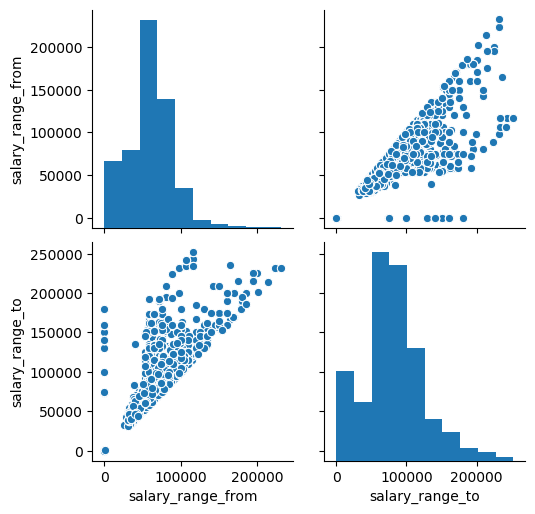

In [106]:
# Pair scatter plots for selected features
sns.pairplot(job_df03_s01)

#### Examine features with missing values

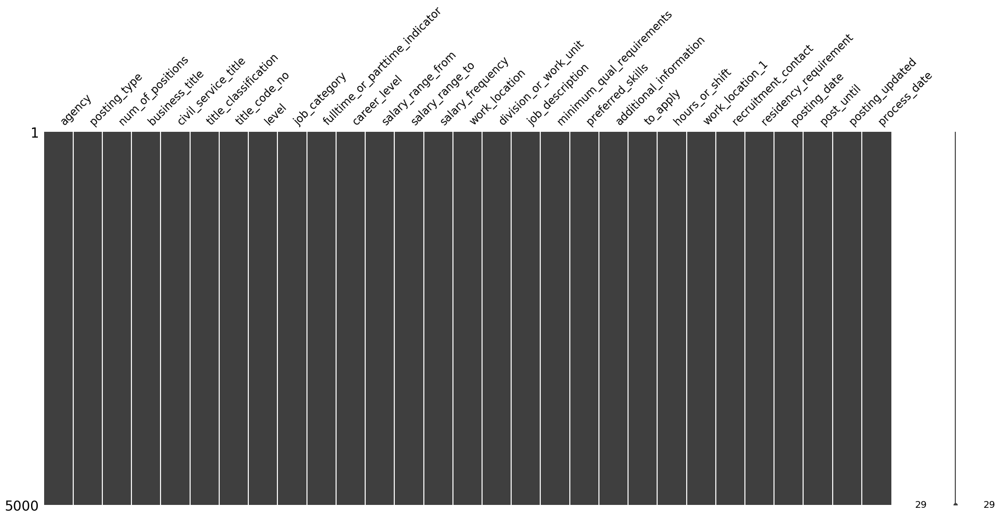

In [107]:
# Visualize missing values in each column
msno.matrix(job_df01_s05)

In [108]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (5% of total N)
job_df01_s05_null_summ01 = pd.DataFrame(job_df01_s05.isnull().sum(),
                                        columns=['null_count'])

job_df01_s05_null_summ02 = job_df01_s05_null_summ01.loc[(job_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
job_df01_s05_null_summ03 = job_df01_s05_null_summ02.reset_index()
print(job_df01_s05_null_summ03)

job_df01_s05_null_summ04 = job_df01_s05_null_summ03.loc[job_df01_s05_null_summ03['null_count'] > (len(job_df01_s05)*.05)]
print('\n', job_df01_s05_null_summ04)

job_df01_s05_null_summ04_remove_lst01 = list(job_df01_s05_null_summ04['index'])
print('\n', job_df01_s05_null_summ04_remove_lst01)

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Examine featues with near zero variances

In [109]:
# Review near-zero variance (NZV) features for possible removal
job_df02_s01_nzv_fit = VarianceThreshold().fit(job_df02_s01)
job_df02_s01_nzv_vc01 = job_df02_s01_nzv_fit.transform(job_df02_s01)

# Get the names of the selected features
job_df02_s01_nzv_fit_select_features = job_df02_s01.columns[job_df02_s01_nzv_fit.get_support()]

job_df02_s01_nzv_df01 = pd.DataFrame(job_df02_s01_nzv_vc01,
                                     columns=job_df02_s01_nzv_fit_select_features)

display(job_df02_s01_nzv_df01.head(5))
print(f'NZV transformed matrix dimensions = {job_df02_s01_nzv_df01.shape}')

print(f'\n{job_df02_s01.shape[1] - job_df02_s01_nzv_df01.shape[1]} near zero variance features were eliminated')

,salary_range_from,salary_range_to
0,42507.0000,48883.00
1,28.0421,33.56
2,105000.0000,115000.00
3,80931.0000,208826.00
4,85371.0000,98177.00


NZV transformed matrix dimensions = (5000, 2)

0 near zero variance features were eliminated


## Release Resources

In [110]:
%%html

<p><b>Shutting down your kernel for this notebook to release resources.</b></p>
<button class="sm-command-button" data-commandlinker-command="kernelmenu:shutdown" style="display:none;">Shutdown Kernel</button>
        
<script>
try {
    els = document.getElementsByClassName("sm-command-button");
    els[0].click();
}
catch(err) {
    // NoOp
}    
</script>

In [111]:
%%javascript

try {
    Jupyter.notebook.save_checkpoint();
    Jupyter.notebook.session.delete();
}
catch(err) {
    // NoOp
}

<IPython.core.display.Javascript object>